# **Cocoa Bean Contamination Detection with YOLOv8**

### **Problem Statement**
This project aims to develop a computer vision system to detect three types of cocoa bean contamination:
- Anthracnose (fungal disease)
- CSSVD (Cocoa Swollen Shoot Virus Disease)
- Healthy beans

### **Environment Setup**

In [1]:
!pip install ultralytics
!pip install tf-explain 

# Import dependencies

import kagglehub
import os
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from ultralytics import YOLO
import threading
import time
from tqdm import tqdm

import tensorflow as tf
from tf_explain.core.grad_cam import GradCAM
import cv2, os, shutil
import yaml
import pandas as pd
import numpy as np
from PIL import Image
import glob

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.9 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found exi

E0000 00:00:1750314276.380246      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750314276.437954      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### **Dataset Configuration**

In [2]:
path = Path('/kaggle/input/amini-cocoa-contamination-dataset')

os.listdir(path)

['dataset', 'SampleSubmission.csv', 'Train.csv', 'Test.csv']

In [8]:
# The code below can be improved.
# Instead of downloading the dataset, 
# You can simply add the dataset to the notebook.
# It is already on Kaggle!

# Download dataset
# path = kagglehub.dataset_download("ohagwucollinspatrick/amini-cocoa-contamination-dataset")
# print(f"Dataset path: {path}")

In [3]:
# Create directories in kaggle notebook

DATASETS_DIR = Path('/kaggle/working/dataset')
DATASETS_DIR.mkdir(parents=True, exist_ok=True)

TRAIN_IMAGES_DIR = DATASETS_DIR / 'images/train'
TRAIN_IMAGES_DIR.mkdir(parents=True, exist_ok=True)

TRAIN_LABELS_DIR = DATASETS_DIR / 'labels/train'
TRAIN_LABELS_DIR.mkdir(parents=True, exist_ok=True)

TEST_IMAGES_DIR = DATASETS_DIR / 'images/test'
TEST_IMAGES_DIR.mkdir(parents=True, exist_ok=True)

VAL_IMAGES_DIR = DATASETS_DIR / 'images/val'
VAL_IMAGES_DIR.mkdir(parents=True, exist_ok=True)

VAL_LABELS_DIR = DATASETS_DIR / 'labels/val'
VAL_LABELS_DIR.mkdir(parents=True, exist_ok=True)

In [4]:
# Copy contents in kaggle datasets to kaggle working directory

INPUT_DATA_DIR = Path(path / 'dataset')

# Copy all contents of INPUT_DATA_DIR into DATASETS_DIR
for item in tqdm(INPUT_DATA_DIR.iterdir()):
    src = item
    dst = DATASETS_DIR / item.name
    if item.is_dir():
        shutil.copytree(src, dst, dirs_exist_ok=True)
    else:
        shutil.copy2(src, dst)

0it [00:00, ?it/s]

### **Data Loading and Exploration**

In [5]:
# Load train and test files
train = pd.read_csv(path / 'Train.csv')
test = pd.read_csv(path / 'Test.csv')
ss = pd.read_csv(path / 'SampleSubmission.csv')

In [6]:
train[['class', 'class_id']].value_counts()

class        class_id
healthy      2           4279
cssvd        1           3223
anthracnose  0           2271
cssvd        0             18
healthy      1              1
Name: count, dtype: int64

In [7]:
class_map = {cls: i for i, cls in enumerate(sorted(train['class'].unique().tolist()))}
class_map

{'anthracnose': 0, 'cssvd': 1, 'healthy': 2}

In [8]:
# Strip any spacing from the class item and make sure that it is a str
train['class'] = train['class'].str.strip()

# Map {'healthy': 2, 'cssvd': 1, anthracnose: 0}
train['class_id'] = train['class'].map(class_map)

In [9]:
train[['class', 'class_id']].value_counts()

class        class_id
healthy      2           4280
cssvd        1           3241
anthracnose  0           2271
Name: count, dtype: int64

In [10]:
# Split the train dataset into train_df & val_df
train_names, val_names = train_test_split(train['Image_ID'].unique(), test_size=0.15, random_state=42)

train_df = train[train['Image_ID'].isin(train_names)]
val_df = train[train['Image_ID'].isin(val_names)]

In [11]:
train_df.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,class_id,ImagePath
0,ID_nBgcAR.jpg,healthy,1.0,75.0,15.0,162.0,195.0,2,dataset/images/train/ID_nBgcAR.jpg
1,ID_nBgcAR.jpg,healthy,1.0,58.0,1.0,133.0,171.0,2,dataset/images/train/ID_nBgcAR.jpg
2,ID_nBgcAR.jpg,healthy,1.0,42.0,29.0,377.0,349.0,2,dataset/images/train/ID_nBgcAR.jpg
3,ID_Kw2v8A.jpg,healthy,1.0,112.0,124.0,404.0,341.0,2,dataset/images/train/ID_Kw2v8A.jpg
4,ID_Kw2v8A.jpg,healthy,1.0,148.0,259.0,413.0,412.0,2,dataset/images/train/ID_Kw2v8A.jpg


In [12]:
train.shape

(9792, 9)

In [13]:
train_df.shape[0] + val_df.shape[0]

9792

In [14]:
train_df.shape, val_df.shape, test.shape

((8236, 9), (1556, 9), (1626, 9))

# **Check for class imbalance**

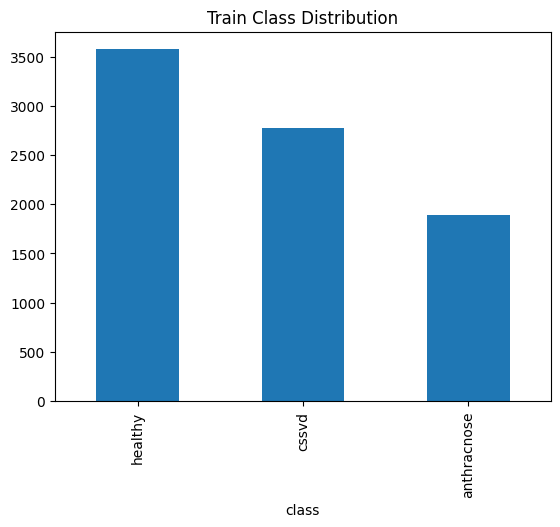

In [15]:
# Check for Train class distribution 
train_df['class'].value_counts().plot(kind='bar')
plt.title('Train Class Distribution')
plt.show();

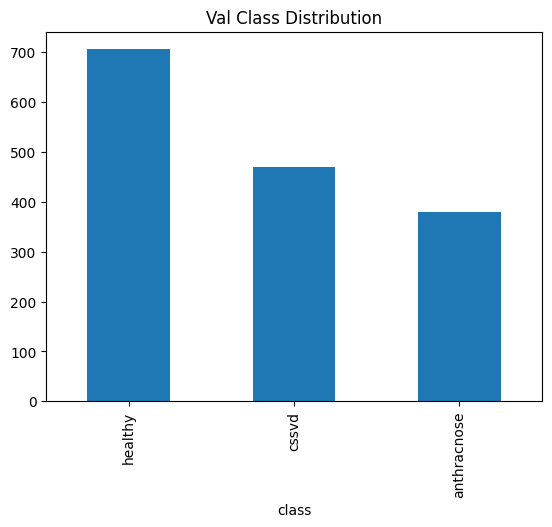

In [16]:
# # Check for Val class distribution 
val_df['class'].value_counts().plot(kind='bar')
plt.title('Val Class Distribution')
plt.show();

### **YOLO Dataset Preparation**

In [17]:
# Create a data.yaml file required by yolo
class_names = sorted(train['class'].unique().tolist())
num_classes = len(class_names)

data_yaml = {
    "path" : str(DATASETS_DIR.absolute()),
    'train': str(TRAIN_IMAGES_DIR.absolute()),
    'val': str(VAL_IMAGES_DIR.absolute()),
    'test': str(TEST_IMAGES_DIR.absolute()),
    'nc': num_classes,
    'names': class_names
}

yaml_path = 'data.yaml'
with open(yaml_path, 'w') as file:
    yaml.dump(data_yaml, file, default_flow_style=False)

# Preview data yaml file
data_yaml

{'path': '/kaggle/working/dataset',
 'train': '/kaggle/working/dataset/images/train',
 'val': '/kaggle/working/dataset/images/val',
 'test': '/kaggle/working/dataset/images/test',
 'nc': 3,
 'names': ['anthracnose', 'cssvd', 'healthy']}

In [18]:
val_image_names = [str(Path(name).stem) for name in val_df['Image_ID'].unique()]
val_image_names[0:7]

['ID_jQBUBv',
 'ID_dWJxmx',
 'ID_Yf4J1R',
 'ID_Emm8Th',
 'ID_ZGNPOK',
 'ID_SWcw7I',
 'ID_J7ff4w']

In [19]:
train_image_names = [str(Path(name).stem) for name in train['ImagePath'].unique()]
train_image_names[0:7]

['ID_nBgcAR',
 'ID_Kw2v8A',
 'ID_ck6aIS',
 'ID_tUqavp',
 'ID_qOoR5L',
 'ID_ilxfrh',
 'ID_Bw9N5J']

In [20]:
# Copy images in val_names to dataset/val and do the same with the labels
for image_name in tqdm(val_names):
    shutil.move(TRAIN_IMAGES_DIR / image_name, VAL_IMAGES_DIR / image_name)
    img_ext = image_name.split('.')[-1]
    label_name = image_name.replace(f'.{img_ext}', '.txt')
    shutil.move(TRAIN_LABELS_DIR / label_name, VAL_LABELS_DIR / label_name)

100%|██████████| 830/830 [00:00<00:00, 14419.39it/s]


### **Data Verification**

Plotting ID_Z3NG0M.jpg with 1 bounding boxes.


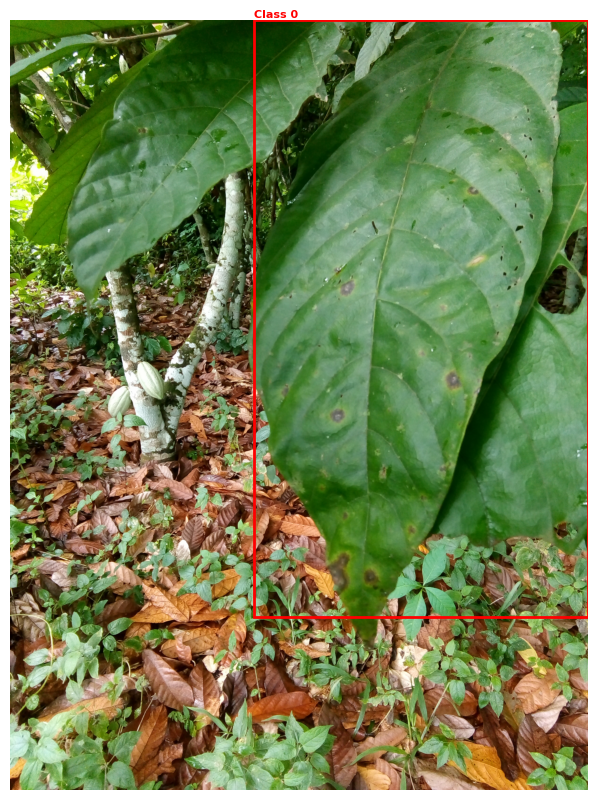

Plotting ID_vHzMKg.jpeg with 1 bounding boxes.


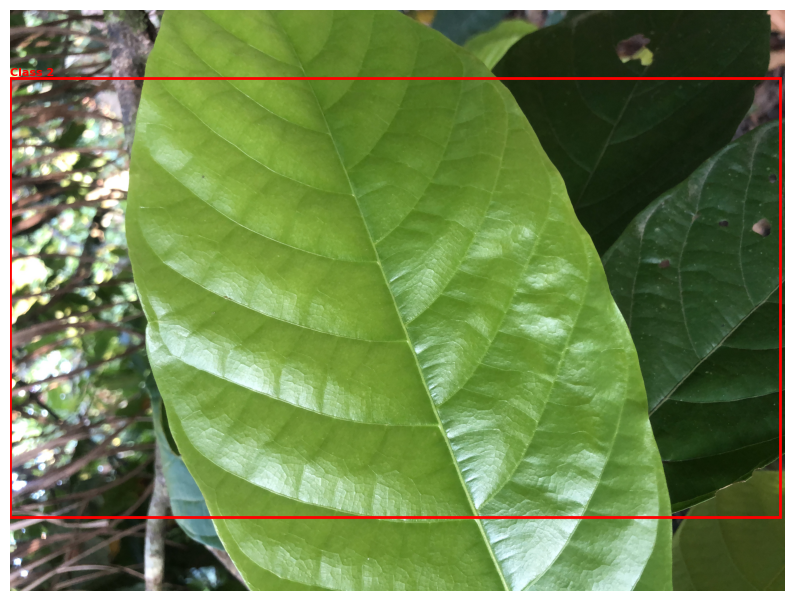

Plotting ID_GKxnzb.jpg with 1 bounding boxes.


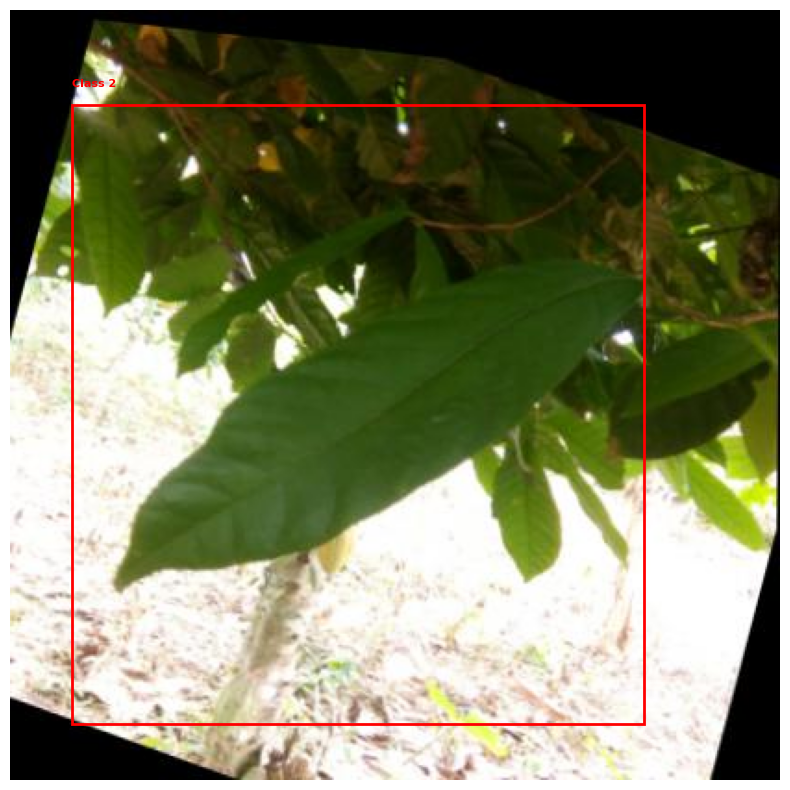

Plotting ID_VpZ899.jpg with 1 bounding boxes.


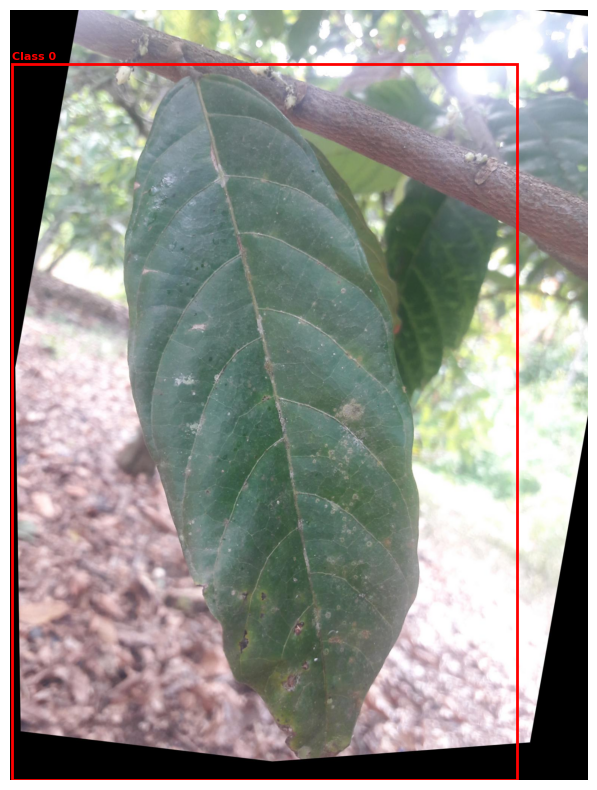

Plotting ID_qNI35r.jpg with 2 bounding boxes.


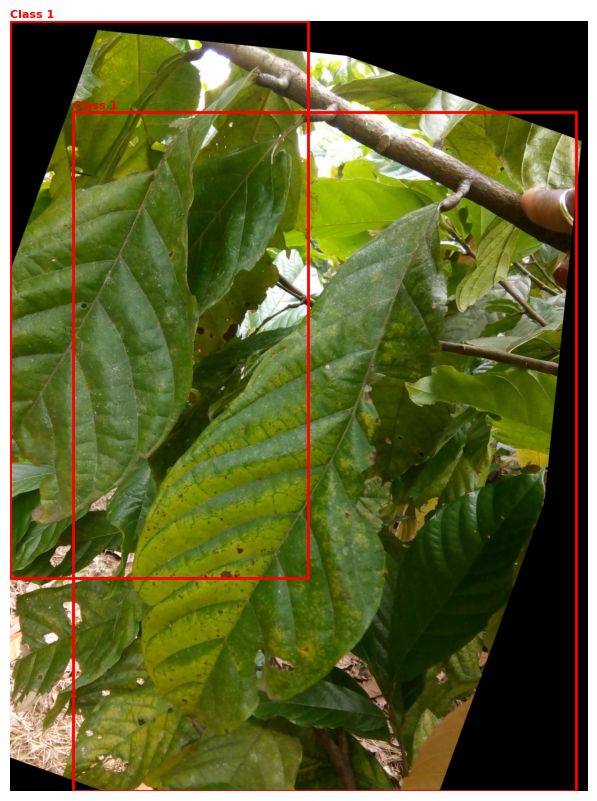

In [21]:
# Plot some images and their bboxes to ensure the conversion was done correctly
def load_annotations(label_path):
    with open(label_path, 'r') as f:
        lines = f.readlines()
    boxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# Function to plot an image with its bounding boxes
def plot_image_with_boxes(image_path, boxes):
    # Load the image
    image = np.array(Image.open(str(image_path)))


    # Get image dimensions
    h, w, _ = image.shape

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Plot each bounding box
    for box in boxes:
        class_id, x_center, y_center, width, height = box
        # Convert YOLO format to corner coordinates
        xmin = int((x_center - width / 2) * w)
        ymin = int((y_center - height / 2) * h)
        xmax = int((x_center + width / 2) * w)
        ymax = int((y_center + height / 2) * h)

        # Draw the bounding box
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                          edgecolor='red', facecolor='none', linewidth=2))
        plt.text(xmin, ymin - 10, f'Class {int(class_id)}', color='red', fontsize=8, weight='bold')

    plt.axis('off')
    plt.show()

# Directories for images and labels
IMAGE_DIR = TRAIN_IMAGES_DIR
LABEL_DIR = TRAIN_LABELS_DIR

# Plot a few images with their annotations
for image_name in os.listdir(IMAGE_DIR)[:5]:
    image_path = IMAGE_DIR / image_name
    img_ext = image_name.split('.')[-1]
    label_path = LABEL_DIR / (image_name.replace(f'.{img_ext}', '.txt'))

    if label_path.exists():
        boxes = load_annotations(label_path)
        print(f"Plotting {image_name} with {len(boxes)} bounding boxes.")
        plot_image_with_boxes(image_path, boxes)
    else:
        print(f"No annotations found for {image_name}.")


### **YOLOv8 Model Training**

In [22]:
# Load model
model = YOLO('yolov8n.pt')

def train_model():
    model.train(
        data='/kaggle/working/data.yaml',
        epochs=50,
        imgsz=640,
        batch=16,
        device=0,
        patience=10,
        optimizer='AdamW',
        lr0=0.001,
        weight_decay=0.0005,
        save_period=5  # Save extra checkpoints
    )

# Run training thread
train_thread = threading.Thread(target=train_model)
train_thread.start()

# Wait max 6 hours
train_thread.join(timeout=6 * 3600)

# If still running, print message
if train_thread.is_alive():
    print("Training time exceeded 6 hours. Model will stop after current epoch...")
else:
    print("Training finished within 6 hours.")

100%|██████████| 6.25M/6.25M [00:00<00:00, 75.2MB/s]


Ultralytics 8.3.156 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=12.0, pre

100%|██████████| 755k/755k [00:00<00:00, 17.9MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 76.2MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1818.3±1938.0 MB/s, size: 1774.6 KB)


train: Scanning /kaggle/working/dataset/labels/train... 4699 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4699/4699 [00:39<00:00, 118.49it/s]

train: /kaggle/working/dataset/images/train/ID_AJD939.jpg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_AMshRT.jpeg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_AOGygM.jpeg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_AbHMqL.jpg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_AhmyiY.jpeg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_AhwlUp.jpeg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_AueB13.jpg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_AzJAHH.jpg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_BBZMEE.jpg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_BFveJq.jpeg: corrupt JPEG restored and saved
train: /kaggle/working/dataset/images/train/ID_BNWZ3w.jpg: corrupt JPEG restored and 

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 341.5±215.7 MB/s, size: 1924.5 KB)


val: Scanning /kaggle/working/dataset/labels/val... 830 images, 0 backgrounds, 0 corrupt: 100%|██████████| 830/830 [00:10<00:00, 82.06it/s] 

val: /kaggle/working/dataset/images/val/ID_AYKor4.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_DEVBif.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_Dcoa03.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_ESQAmP.jpeg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_FtYRqz.jpeg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_GWhiLp.jpeg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_H9qAYr.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_Hmxdwo.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_HuMwmi.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_J7hL2Y.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_JHsmyN.jpeg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val

Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.18G       1.35      1.994      1.626         50        640: 100%|██████████| 294/294 [02:25<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.26it/s]

                   all        830       1556      0.489      0.454      0.445      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.44G      1.331      1.647      1.605         43        640: 100%|██████████| 294/294 [02:24<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.41it/s]

                   all        830       1556       0.57      0.493      0.515      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.46G      1.315      1.566      1.598         46        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.27it/s]

                   all        830       1556       0.63      0.525      0.552      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.47G      1.287      1.523      1.577         39        640: 100%|██████████| 294/294 [02:18<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.34it/s]

                   all        830       1556      0.598      0.514      0.552      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.49G      1.262      1.448      1.557         69        640: 100%|██████████| 294/294 [02:20<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.29it/s]

                   all        830       1556      0.676      0.539      0.581      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.51G      1.244      1.416      1.544         46        640: 100%|██████████| 294/294 [02:20<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.40it/s]

                   all        830       1556      0.669      0.524      0.577      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.53G      1.219      1.391       1.53         49        640: 100%|██████████| 294/294 [02:23<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.30it/s]

                   all        830       1556      0.695      0.572      0.626      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.54G       1.21      1.364      1.519         49        640: 100%|██████████| 294/294 [02:23<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.26it/s]

                   all        830       1556      0.655      0.547      0.619      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.56G      1.197      1.341       1.51         51        640: 100%|██████████| 294/294 [02:25<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.32it/s]

                   all        830       1556      0.698      0.595      0.659      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.58G      1.175      1.292      1.495         36        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.33it/s]

                   all        830       1556      0.716      0.597      0.684      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.59G       1.17      1.277      1.495         35        640: 100%|██████████| 294/294 [02:21<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.29it/s]

                   all        830       1556      0.709      0.586      0.662      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.61G      1.165      1.263      1.488         42        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.43it/s]

                   all        830       1556      0.727      0.598      0.684      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.63G      1.154      1.228      1.482         40        640: 100%|██████████| 294/294 [02:22<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.26it/s]

                   all        830       1556      0.787      0.584       0.69      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.64G       1.15      1.222      1.472         43        640: 100%|██████████| 294/294 [02:24<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.33it/s]

                   all        830       1556      0.726      0.599      0.681      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.66G      1.151      1.212      1.478         42        640: 100%|██████████| 294/294 [02:20<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.25it/s]

                   all        830       1556       0.72      0.589      0.674      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.68G      1.137      1.185      1.465         43        640: 100%|██████████| 294/294 [02:21<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.32it/s]


                   all        830       1556      0.757      0.585       0.68      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       2.7G       1.12      1.174      1.452         47        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.32it/s]

                   all        830       1556      0.759       0.62      0.696      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.71G       1.13      1.165      1.459         58        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.30it/s]

                   all        830       1556      0.736      0.624       0.71      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.73G       1.12      1.176      1.452         60        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.28it/s]

                   all        830       1556      0.733      0.642       0.71      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.75G      1.098      1.139      1.442         45        640: 100%|██████████| 294/294 [02:20<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.34it/s]

                   all        830       1556      0.729      0.633        0.7      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.76G      1.108      1.124      1.443         51        640: 100%|██████████| 294/294 [02:18<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.29it/s]

                   all        830       1556      0.733      0.636      0.706      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.78G      1.107      1.131      1.438         36        640: 100%|██████████| 294/294 [02:18<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]

                   all        830       1556       0.76       0.63      0.714      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       2.8G       1.09      1.112      1.428         44        640: 100%|██████████| 294/294 [02:19<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.29it/s]

                   all        830       1556      0.782      0.616      0.716      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.81G      1.099      1.098      1.436         35        640: 100%|██████████| 294/294 [02:20<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.40it/s]

                   all        830       1556      0.726      0.647      0.716      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.83G      1.081      1.096       1.42         46        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.30it/s]

                   all        830       1556      0.718      0.642      0.714      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.85G      1.075      1.089      1.422         52        640: 100%|██████████| 294/294 [02:23<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.27it/s]

                   all        830       1556      0.757      0.611      0.705      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.87G       1.08       1.08      1.416         52        640: 100%|██████████| 294/294 [02:21<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.38it/s]

                   all        830       1556      0.734      0.648       0.71      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.88G      1.072      1.068      1.415         51        640: 100%|██████████| 294/294 [02:20<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.31it/s]

                   all        830       1556      0.731      0.645      0.718      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       2.9G      1.069      1.051      1.414         46        640: 100%|██████████| 294/294 [02:19<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.27it/s]

                   all        830       1556      0.762      0.633      0.729      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.92G      1.061      1.052      1.405         47        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.30it/s]

                   all        830       1556      0.718      0.653      0.719      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.93G      1.051      1.031      1.398         54        640: 100%|██████████| 294/294 [02:22<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.32it/s]

                   all        830       1556      0.786      0.614      0.727      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.95G      1.048      1.029        1.4         49        640: 100%|██████████| 294/294 [02:23<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.36it/s]


                   all        830       1556      0.769      0.628      0.724      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.97G      1.049      1.019      1.394         43        640: 100%|██████████| 294/294 [02:21<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.37it/s]

                   all        830       1556       0.75      0.654      0.728      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.98G      1.041      1.002      1.385         61        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.37it/s]

                   all        830       1556      0.744      0.664      0.737      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         3G       1.03     0.9935      1.384         47        640: 100%|██████████| 294/294 [02:19<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.33it/s]

                   all        830       1556      0.754       0.65      0.734      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.02G      1.029     0.9937      1.386         48        640: 100%|██████████| 294/294 [02:17<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.42it/s]

                   all        830       1556      0.805      0.616      0.735      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.04G      1.031     0.9867      1.379         53        640: 100%|██████████| 294/294 [02:19<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.36it/s]

                   all        830       1556      0.772      0.632      0.737      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.05G      1.013     0.9583      1.375         48        640: 100%|██████████| 294/294 [02:18<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.39it/s]

                   all        830       1556       0.74      0.641      0.729       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.07G      1.017     0.9636      1.376         35        640: 100%|██████████| 294/294 [02:19<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.38it/s]

                   all        830       1556      0.765      0.647      0.728      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.09G      1.008      0.968      1.372         46        640: 100%|██████████| 294/294 [02:17<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.36it/s]

                   all        830       1556      0.728      0.674      0.735      0.499


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       3.1G      1.039     0.9411      1.473         19        640: 100%|██████████| 294/294 [02:21<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.33it/s]

                   all        830       1556      0.769      0.644      0.736      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.12G      1.009     0.8792      1.438         17        640: 100%|██████████| 294/294 [02:17<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.41it/s]

                   all        830       1556       0.76      0.662      0.741      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.14G      1.002     0.8626       1.44         25        640: 100%|██████████| 294/294 [02:18<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.35it/s]

                   all        830       1556      0.744      0.671      0.739      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.16G     0.9917     0.8498      1.428         19        640: 100%|██████████| 294/294 [02:17<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.40it/s]

                   all        830       1556      0.735      0.676      0.736      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.17G       0.98     0.8444      1.422         19        640: 100%|██████████| 294/294 [02:18<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.35it/s]

                   all        830       1556      0.766      0.656      0.739        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.19G     0.9651     0.8336      1.415         22        640: 100%|██████████| 294/294 [02:17<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.39it/s]

                   all        830       1556      0.754       0.66      0.741        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.21G     0.9614     0.8237      1.409         17        640: 100%|██████████| 294/294 [02:16<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.31it/s]

                   all        830       1556       0.76      0.671      0.738      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.22G     0.9465     0.8027      1.393         24        640: 100%|██████████| 294/294 [02:16<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.39it/s]

                   all        830       1556      0.765      0.659      0.743      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.24G     0.9474     0.8037      1.397         21        640: 100%|██████████| 294/294 [02:18<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.32it/s]

                   all        830       1556      0.752      0.662      0.741      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.26G     0.9427     0.7981      1.393         19        640: 100%|██████████| 294/294 [02:17<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.38it/s]

                   all        830       1556      0.787      0.639       0.74      0.505



50 epochs completed in 2.230 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.156 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.34it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        830       1556      0.752      0.671      0.743      0.505
           anthracnose        252        385      0.768      0.655      0.738      0.502
                 cssvd        306        465      0.755      0.673      0.733      0.514
               healthy        272        706      0.733      0.686      0.758        0.5
Speed: 0.2ms preprocess, 1.6ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train
Training finished within 6 hours.


### **Model Evaluation**

In [23]:
# Validate the model on the validation set
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')
results = model.val()

Ultralytics 8.3.156 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1893.3±594.9 MB/s, size: 1558.4 KB)


val: Scanning /kaggle/working/dataset/labels/val.cache... 830 images, 0 backgrounds, 0 corrupt: 100%|██████████| 830/830 [00:00<?, ?it/s]

val: /kaggle/working/dataset/images/val/ID_AYKor4.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_DEVBif.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_Dcoa03.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_ESQAmP.jpeg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_FtYRqz.jpeg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_GWhiLp.jpeg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_H9qAYr.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_Hmxdwo.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_HuMwmi.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_J7hL2Y.jpg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val/ID_JHsmyN.jpeg: corrupt JPEG restored and saved
val: /kaggle/working/dataset/images/val


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [00:20<00:00,  2.49it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        830       1556      0.757      0.665      0.742      0.504
           anthracnose        252        385      0.772      0.647      0.736        0.5
                 cssvd        306        465      0.759      0.671      0.733      0.515
               healthy        272        706      0.741      0.677      0.758      0.499
Speed: 0.7ms preprocess, 2.2ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val


In [25]:
# Load the trained YOLO model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Path to the test images directory
test_dir_path = TEST_IMAGES_DIR

# Get a list of all image files in the test directory
image_files = os.listdir(test_dir_path)

# Initialize an empty list to store the results for all images
all_data = []

# Iterate through each image in the directory
for image_file in tqdm(image_files):
    # Full path to the image
    img_path = os.path.join(test_dir_path, image_file)

    # Make predictions on the image
    results = model(img_path)

    # Extract bounding boxes, confidence scores, and class labels
    boxes = results[0].boxes.xyxy.tolist() if results[0].boxes else []  # Bounding boxes in xyxy format
    classes = results[0].boxes.cls.tolist() if results[0].boxes else []  # Class indices
    confidences = results[0].boxes.conf.tolist() if results[0].boxes else []  # Confidence scores
    names = results[0].names  # Class names dictionary

    if boxes:  # If detections are found
        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            detected_class = names[int(cls)]  # Get the class name from the names dictionary

            # Add the result to the all_data list
            all_data.append({
                'Image_ID': str(image_file),
                'class': detected_class,
                'confidence': conf,
                'ymin': y1,
                'xmin': x1,
                'ymax': y2,
                'xmax': x2
            })
    else:  # If no objects are detected
        all_data.append({
            'Image_ID': str(image_file),
            'class': "None",
            'confidence': None,
            'ymin': None,
            'xmin': None,
            'ymax': None,
            'xmax': None
        })

  0%|          | 0/1626 [00:00<?, ?it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ytdXbX.jpg: 640x480 1 anthracnose, 34.2ms
Speed: 2.0ms preprocess, 34.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


  0%|          | 1/1626 [00:00<04:59,  5.42it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JqWr5O.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.1ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jHqWXa.jpg: 640x480 1 anthracnose, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  0%|          | 3/1626 [00:00<02:39, 10.15it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_gUEBGE.jpg: 640x480 1 anthracnose, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qnh2w8.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  0%|          | 5/1626 [00:00<04:06,  6.56it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_AopVga.jpg: 640x640 3 healthys, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_sTcTkI.jpeg: 480x640 4 healthys, 33.8ms
Speed: 2.7ms preprocess, 33.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


  0%|          | 7/1626 [00:00<03:13,  8.36it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ho5pCV.jpeg: 640x480 4 healthys, 8.5ms
Speed: 3.5ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rdRpPa.jpg: 640x480 2 cssvds, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 480)


  1%|          | 9/1626 [00:01<03:09,  8.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rSmGHZ.jpg: 640x480 1 anthracnose, 10.9ms
Speed: 5.5ms preprocess, 10.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


  1%|          | 10/1626 [00:01<03:57,  6.81it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wXf9J2.jpg: 640x480 1 anthracnose, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  1%|          | 11/1626 [00:01<04:22,  6.15it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_lbQnF2.jpeg: 640x480 2 cssvds, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  1%|          | 12/1626 [00:01<04:18,  6.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_sQdLfM.jpeg: 640x288 1 healthy, 33.9ms
Speed: 1.9ms preprocess, 33.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


  1%|          | 13/1626 [00:01<04:04,  6.60it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UQFoy1.jpg: 640x480 3 anthracnoses, 7.2ms
Speed: 2.5ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_C3AIRq.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_k9lo30.jpg: 640x480 4 cssvds, 6.2ms
Speed: 2.3ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  1%|          | 16/1626 [00:01<02:24, 11.13it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JfM7dx.jpg: 640x480 4 anthracnoses, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BhOD7h.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_gBtRxw.jpeg: 480x640 2 healthys, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


  1%|          | 19/1626 [00:02<02:07, 12.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_f6eOd7.jpeg: 640x288 1 anthracnose, 8.0ms
Speed: 2.0ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_RirekC.jpg: 640x384 4 cssvds, 33.2ms
Speed: 1.4ms preprocess, 33.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)


  1%|▏         | 21/1626 [00:02<02:06, 12.70it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_IlKAAg.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 2.4ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_G8FKIB.jpg: 480x640 3 anthracnoses, 6.9ms
Speed: 2.3ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_IemiUM.jpg: 640x640 2 healthys, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ZiomN9.jpg: 640x480 3 anthracnoses, 7.7ms
Speed: 3.0ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  2%|▏         | 25/1626 [00:02<01:55, 13.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XqWUBD.jpg: 640x480 1 cssvd, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AHlc9P.jpg: 640x480 2 healthys, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  2%|▏         | 27/1626 [00:02<01:49, 14.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_SwIxej.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eNUmPw.jpg: 640x640 5 healthys, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_anegvH.jpeg: 640x288 2 healthys, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_VbGL5b.JPG: 640x480 1 cssvd, 8.2ms
Speed: 2.9ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  2%|▏         | 31/1626 [00:02<01:35, 16.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_d0hoEZ.jpg: 640x640 2 healthys, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_fVoX4C.jpg: 640x480 1 cssvd, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_r8vfga.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YhSvIO.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.3ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


  2%|▏         | 35/1626 [00:02<01:15, 21.01it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JCXrae.jpg: 640x480 1 healthy, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qxOohj.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Ne1ISX.jpeg: 288x640 1 cssvd, 31.3ms
Speed: 1.1ms preprocess, 31.3ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


  2%|▏         | 38/1626 [00:03<01:21, 19.60it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QgrbIr.jpg: 640x480 4 cssvds, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rMv7Zl.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_p8IW20.jpeg: 640x288 1 anthracnose, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)


  3%|▎         | 41/1626 [00:03<01:21, 19.49it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_mj9r13.jpeg: 640x480 1 anthracnose, 1 healthy, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Z5E5sR.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wqplu9.jpg: 640x640 1 healthy, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


  3%|▎         | 44/1626 [00:03<01:56, 13.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GqsAlR.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UTMPlH.jpeg: 640x288 1 anthracnose, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


  3%|▎         | 46/1626 [00:03<01:50, 14.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_oE9rtC.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Cc4hHM.jpg: 640x384 1 cssvd, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /kaggle/working/dataset/images/test/ID_ZNueIB.jpg: 640x480 2 cssvds, 6.7ms
Speed: 1.8ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GCZ1T9.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  3%|▎         | 50/1626 [00:03<01:23, 18.87it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tIC8Rp.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_j5mVgB.JPG: 640x480 1 anthracnose, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yze4gA.jpg: 640x480 4 cssvds, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  3%|▎         | 53/1626 [00:04<01:31, 17.10it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PrV1eU.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UEtuEF.jpg: 640x480 1 cssvd, 1 healthy, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EJgRE4.jpg: 640x640 2 healthys, 6.9ms
Speed: 2.2ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


  3%|▎         | 56/1626 [00:04<01:36, 16.34it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_eKexBX.JPG: 640x480 2 healthys, 7.2ms
Speed: 2.8ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_oU6d6Q.jpg: 640x480 3 cssvds, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  4%|▎         | 58/1626 [00:04<01:40, 15.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fvOAVw.jpg: 640x640 4 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_sY0Ns4.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kz9PiB.jpeg: 640x480 3 healthys, 6.6ms
Speed: 3.0ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  4%|▍         | 61/1626 [00:04<01:39, 15.69it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_DdPn6R.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Yg0KUv.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_y680f0.jpeg: 480x640 2 cssvds, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


  4%|▍         | 64/1626 [00:04<01:34, 16.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_B4zGjd.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_J3dqOS.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Yc3rtZ.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.6ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  4%|▍         | 67/1626 [00:04<01:28, 17.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_uPiHNH.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mHoDGw.JPG: 640x480 1 cssvd, 1 healthy, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  4%|▍         | 69/1626 [00:05<01:55, 13.49it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LeQzfF.jpeg: 480x640 4 healthys, 7.5ms
Speed: 2.7ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_I5eBPX.jpeg: 640x480 2 healthys, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  4%|▍         | 71/1626 [00:05<02:24, 10.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_VOLpYN.jpg: 480x640 1 anthracnose, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_d863CL.jpg: 640x480 2 healthys, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xjnuvj.jpg: 640x640 3 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_cyOfnc.jpg: 640x480 3 cssvds, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


  5%|▍         | 75/1626 [00:05<01:49, 14.15it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_uldgmr.jpg: 640x640 3 healthys, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_tBKR7L.jpeg: 640x288 2 healthys, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


  5%|▍         | 77/1626 [00:05<01:43, 15.01it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_V4HYsA.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eFa8g0.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zkdTGk.jpg: 640x480 4 anthracnoses, 1 healthy, 6.2ms
Speed: 2.6ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  5%|▍         | 80/1626 [00:05<01:33, 16.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UzoTeR.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yIcAt3.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  5%|▌         | 82/1626 [00:06<01:46, 14.48it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ysQprs.jpg: 640x480 1 cssvd, 6.7ms
Speed: 1.8ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_w4Fsqv.jpeg: 640x480 1 cssvd, 6.7ms
Speed: 3.1ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  5%|▌         | 84/1626 [00:06<01:53, 13.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_sNijYN.jpg: 640x480 2 healthys, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EOFmpE.jpeg: 640x288 1 anthracnose, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)


  5%|▌         | 86/1626 [00:06<01:47, 14.33it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XwgRC8.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xQCzG9.jpg: 640x480 4 cssvds, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  5%|▌         | 88/1626 [00:06<01:46, 14.47it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XBQWUe.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kJARM7.jpg: 640x480 3 healthys, 5.8ms
Speed: 2.0ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_G7Rbzj.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_W4b7ZX.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


  6%|▌         | 92/1626 [00:06<01:27, 17.60it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xRuM49.jpg: 640x480 5 healthys, 5.8ms
Speed: 1.7ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZXdMsB.jpg: 640x480 5 cssvds, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UDljRB.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  6%|▌         | 95/1626 [00:06<01:38, 15.46it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_q6l1gT.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_LhPlyT.jpeg: 480x640 2 anthracnoses, 7.1ms
Speed: 2.8ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


  6%|▌         | 97/1626 [00:07<01:39, 15.30it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_CqDi1f.jpg: 480x640 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_RgKZv7.jpeg: 640x480 1 cssvd, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  6%|▌         | 99/1626 [00:07<01:51, 13.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_dHYPgN.jpg: 640x480 4 anthracnoses, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CBkuOC.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


  6%|▌         | 101/1626 [00:07<01:58, 12.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Q0XNxq.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 1.8ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_PKIRRi.jpeg: 640x288 1 anthracnose, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_V0D6Lp.jpeg: 640x288 2 anthracnoses, 6.6ms
Speed: 1.1ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_b3HQYb.jpg: 640x480 1 anthracnose, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


  6%|▋         | 105/1626 [00:07<01:52, 13.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_n9Z46S.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_vdGXxv.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.1ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_teJw25.jpeg: 640x480 2 cssvds, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  7%|▋         | 108/1626 [00:07<01:54, 13.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yZYd0h.jpg: 640x480 1 cssvd, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_LW5x6q.jpg: 640x480 2 anthracnoses, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_R9pWyO.jpg: 640x640 2 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_TJq3qJ.jpg: 640x480 3 cssvds, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


  7%|▋         | 112/1626 [00:08<01:26, 17.43it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nSawWh.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ABDCyn.jpeg: 640x480 3 healthys, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_RxjY1r.jpg: 480x640 1 healthy, 7.2ms
Speed: 2.7ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


  7%|▋         | 115/1626 [00:08<01:51, 13.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_sBkTP4.jpg: 640x480 1 cssvd, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tW9laK.jpeg: 640x288 3 healthys, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


  7%|▋         | 117/1626 [00:08<01:47, 14.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LdUYMx.jpg: 640x480 2 cssvds, 7.3ms
Speed: 2.6ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_S4UOLv.jpg: 640x640 5 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


  7%|▋         | 119/1626 [00:08<01:41, 14.88it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_AweW1B.jpg: 640x480 1 anthracnose, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Ko3wiJ.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_U0BYn7.jpg: 640x480 2 anthracnoses, 5.9ms
Speed: 2.1ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_JsIHyJ.JPG: 640x480 1 cssvd, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  8%|▊         | 123/1626 [00:08<01:33, 16.01it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yYAwAy.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CuBkOO.jpg: 640x640 2 healthys, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_wXk3xY.jpeg: 640x480 3 healthys, 8.3ms
Speed: 3.2ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


  8%|▊         | 126/1626 [00:09<01:43, 14.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_biAp3Y.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Hp6I1X.jpg: 640x640 3 healthys, 7.6ms
Speed: 3.1ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_GD1hTT.jpeg: 640x480 5 healthys, 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  8%|▊         | 129/1626 [00:09<01:47, 13.96it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_CsD8EL.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Lpv49N.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.1ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_OgEb5I.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


  8%|▊         | 132/1626 [00:09<01:29, 16.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_loMvz3.jpeg: 480x640 2 healthys, 7.2ms
Speed: 2.8ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_jaeOlD.jpg: 640x640 6 healthys, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


  8%|▊         | 134/1626 [00:09<01:35, 15.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jO4Pjm.jpeg: 640x288 1 anthracnose, 7.4ms
Speed: 1.8ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_TCRFEQ.JPG: 640x640 2 healthys, 7.0ms
Speed: 3.1ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


  8%|▊         | 136/1626 [00:09<01:42, 14.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_BcNWAl.jpeg: 640x480 1 cssvd, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mirK4L.JPG: 640x480 8 healthys, 7.1ms
Speed: 2.8ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  8%|▊         | 138/1626 [00:10<02:04, 11.99it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xQH3S6.jpeg: 640x480 3 healthys, 7.5ms
Speed: 3.1ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kIeaQ8.jpg: 640x480 1 cssvd, 6.5ms
Speed: 1.8ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  9%|▊         | 140/1626 [00:10<02:21, 10.53it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XUxHSs.jpg: 640x480 2 cssvds, 6.4ms
Speed: 1.8ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eW60kF.jpeg: 640x640 1 anthracnose, 7.3ms
Speed: 3.4ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


  9%|▊         | 142/1626 [00:10<02:13, 11.15it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OC53ff.jpg: 640x480 1 cssvd, 6.9ms
Speed: 2.1ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rGRsVE.jpg: 640x480 1 cssvd, 6.8ms
Speed: 1.8ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_htu4s6.jpeg: 640x480 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


  9%|▉         | 145/1626 [00:10<02:02, 12.04it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PH3bRp.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Gasjw8.jpg: 640x480 3 cssvds, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


  9%|▉         | 147/1626 [00:10<01:57, 12.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MpNTbH.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kHJXVe.jpg: 640x480 1 anthracnose, 7.2ms
Speed: 2.2ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ktdjLR.jpeg: 288x640 3 anthracnoses, 7.3ms
Speed: 1.7ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


  9%|▉         | 150/1626 [00:10<01:44, 14.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GdW3ec.jpg: 640x480 3 cssvds, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_h8uMuy.jpg: 480x640 1 cssvd, 6.8ms
Speed: 1.9ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_hdsYyk.jpg: 640x480 1 cssvd, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_OvOLtN.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


  9%|▉         | 154/1626 [00:11<01:18, 18.73it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Tsb0A0.jpg: 480x640 2 anthracnoses, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_UbLWzh.jpg: 640x480 2 cssvds, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DyHG2r.jpg: 480x640 1 cssvd, 6.4ms
Speed: 1.8ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 10%|▉         | 157/1626 [00:11<01:21, 17.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_l8hBRM.JPG: 640x480 3 healthys, 7.6ms
Speed: 2.7ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XBLbYU.JPG: 640x640 3 healthys, 7.3ms
Speed: 3.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 10%|▉         | 159/1626 [00:11<01:33, 15.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_z4YpAE.jpeg: 640x288 1 anthracnose, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_kjTAmo.jpg: 640x480 3 cssvds, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 10%|▉         | 161/1626 [00:11<01:32, 15.76it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_mGappw.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 1.9ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WQpdRN.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FfJt83.JPG: 640x480 2 healthys, 6.4ms
Speed: 2.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 10%|█         | 164/1626 [00:11<01:25, 17.18it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nBlDry.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Fh5Pcm.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kzlLQD.jpeg: 640x288 1 anthracnose, 8.9ms
Speed: 1.9ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 10%|█         | 167/1626 [00:11<01:21, 17.88it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LuM0zS.jpg: 640x480 1 cssvd, 3 healthys, 6.6ms
Speed: 1.8ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_bJZocr.JPG: 640x480 1 healthy, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 10%|█         | 169/1626 [00:12<01:29, 16.36it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_roZ2bL.jpeg: 640x480 1 cssvd, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aRAs2F.jpeg: 480x640 2 healthys, 7.0ms
Speed: 2.9ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 11%|█         | 171/1626 [00:12<02:04, 11.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vXgQwz.jpg: 640x480 1 anthracnose, 7.6ms
Speed: 3.0ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nl5wJe.jpeg: 640x288 1 cssvd, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)


 11%|█         | 173/1626 [00:12<02:20, 10.32it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jmNFmJ.jpg: 640x480 2 healthys, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XoAAeX.jpeg: 480x640 1 healthy, 7.1ms
Speed: 2.8ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 11%|█         | 175/1626 [00:12<02:15, 10.68it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xhV160.jpeg: 480x640 2 healthys, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_JQeL3x.jpeg: 640x288 2 healthys, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)


 11%|█         | 177/1626 [00:12<02:06, 11.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kh5ilZ.JPG: 640x480 1 anthracnose, 1 cssvd, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IcsbIu.jpg: 640x640 4 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 11%|█         | 179/1626 [00:13<01:55, 12.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_F7a5DB.jpg: 480x640 2 cssvds, 6.9ms
Speed: 2.0ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_MZzLPS.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kvMeX2.JPG: 640x480 1 cssvd, 1 healthy, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 11%|█         | 182/1626 [00:13<01:35, 15.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Josquf.JPG: 640x480 3 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EsHAwO.JPG: 640x480 1 cssvd, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 11%|█▏        | 184/1626 [00:13<01:45, 13.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LuOSty.JPG: 640x480 2 healthys, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_RcvF8N.jpeg: 640x288 2 healthys, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 11%|█▏        | 186/1626 [00:13<01:53, 12.70it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UVK5Xv.jpg: 640x480 1 healthy, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FyJ6Hz.jpeg: 640x480 3 healthys, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 12%|█▏        | 188/1626 [00:13<02:00, 11.96it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Z2Yu1j.jpg: 640x480 3 healthys, 6.1ms
Speed: 1.8ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DQIbC9.jpeg: 640x288 2 anthracnoses, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_wUUlmx.jpeg: 640x480 1 anthracnose, 7.5ms
Speed: 2.8ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 12%|█▏        | 191/1626 [00:14<02:00, 11.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YMWl03.jpg: 640x480 2 anthracnoses, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eNeH9u.jpg: 640x480 2 anthracnoses, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_G88tEZ.JPG: 640x480 1 anthracnose, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 12%|█▏        | 194/1626 [00:14<01:44, 13.68it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_h2mTi3.jpg: 640x640 3 healthys, 6.9ms
Speed: 2.1ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_MaKmbG.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zpXC4u.JPG: 640x480 1 healthy, 6.7ms
Speed: 2.6ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 12%|█▏        | 197/1626 [00:14<01:31, 15.68it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XzSqhK.JPG: 640x480 1 cssvd, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_u9M7lL.jpeg: 640x480 3 healthys, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 12%|█▏        | 199/1626 [00:14<01:57, 12.11it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JTlzxh.jpeg: 640x288 1 anthracnose, 7.9ms
Speed: 1.9ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_mk1ErX.jpeg: 640x480 3 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 12%|█▏        | 201/1626 [00:14<02:23,  9.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_KGAwoD.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_psMYBH.jpeg: 640x480 2 healthys, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 12%|█▏        | 203/1626 [00:15<02:16, 10.45it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Rs5wX2.jpeg: 640x640 1 anthracnose, 2 healthys, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_C0Cmx7.jpg: 640x480 1 anthracnose, 1 cssvd, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 13%|█▎        | 205/1626 [00:15<02:22,  9.98it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tARLwW.jpeg: 640x480 1 anthracnose, 3 healthys, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XeuIbQ.jpg: 640x480 2 cssvds, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 13%|█▎        | 207/1626 [00:15<02:22,  9.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_FoiHnH.jpg: 480x640 1 cssvd, 7.0ms
Speed: 1.6ms preprocess, 7.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_bu0b88.jpg: 640x480 1 healthy, 7.2ms
Speed: 2.5ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 13%|█▎        | 209/1626 [00:15<02:08, 11.04it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_H1mmQM.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ocMDD4.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Un7EbF.jpeg: 640x640 1 cssvd, 7.3ms
Speed: 3.4ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 13%|█▎        | 212/1626 [00:15<01:46, 13.22it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jUGauO.jpg: 640x480 2 cssvds, 6.8ms
Speed: 2.3ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jcfiYK.jpeg: 640x480 1 anthracnose, 1 cssvd, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 13%|█▎        | 214/1626 [00:15<01:52, 12.59it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GRoUWA.JPG: 640x480 3 healthys, 6.8ms
Speed: 2.8ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ej2wFd.jpg: 480x640 3 healthys, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 13%|█▎        | 216/1626 [00:16<01:53, 12.40it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Sx5Cni.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_vWVDBR.jpg: 480x640 6 healthys, 7.5ms
Speed: 2.8ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 13%|█▎        | 218/1626 [00:16<02:08, 10.93it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fXAcgg.jpg: 640x480 1 cssvd, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_PzpVJN.jpg: 640x480 3 cssvds, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 14%|█▎        | 220/1626 [00:16<02:00, 11.68it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_AwZkd2.jpg: 640x480 3 anthracnoses, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZOVQFd.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_L7VuIR.jpg: 640x512 2 cssvds, 47.9ms
Speed: 3.2ms preprocess, 47.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 512)


 14%|█▎        | 223/1626 [00:16<01:38, 14.23it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QqFVxR.jpeg: 288x640 1 anthracnose, 1 cssvd, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_jFyEIK.jpg: 640x480 1 anthracnose, 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 14%|█▍        | 225/1626 [00:16<01:49, 12.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ZNZFXJ.jpg: 640x480 2 healthys, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kDub9n.jpeg: 480x640 2 healthys, 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 14%|█▍        | 227/1626 [00:17<02:24,  9.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YKtTP5.jpg: 640x640 4 healthys, 6.5ms
Speed: 3.6ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_vkidYy.jpeg: 640x640 1 anthracnose, 6.4ms
Speed: 3.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 14%|█▍        | 229/1626 [00:17<02:08, 10.88it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_x7GErW.jpg: 640x480 7 cssvds, 6.6ms
Speed: 2.4ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QWF4Qa.jpg: 640x480 3 cssvds, 9.6ms
Speed: 3.2ms preprocess, 9.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_N1yqEo.jpg: 480x640 2 anthracnoses, 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 14%|█▍        | 232/1626 [00:17<02:40,  8.67it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_HiEYk8.jpg: 640x480 1 healthy, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QegU5S.jpeg: 640x640 3 anthracnoses, 7.2ms
Speed: 3.3ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 14%|█▍        | 234/1626 [00:17<02:33,  9.05it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_F7Or4u.jpg: 640x480 2 cssvds, 6.9ms
Speed: 2.1ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_oUmw03.jpeg: 480x640 3 healthys, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 15%|█▍        | 236/1626 [00:18<02:21,  9.80it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_oC7ET9.jpeg: 480x640 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_JaY2HL.jpg: 640x480 1 healthy, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 15%|█▍        | 238/1626 [00:18<02:19,  9.96it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XSQdrt.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iKbbSX.jpg: 640x480 1 cssvd, 1 healthy, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 15%|█▍        | 240/1626 [00:18<02:23,  9.66it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_N58WHF.jpg: 640x480 1 healthy, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_d6gpj1.jpg: 640x480 2 cssvds, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_d9Kawp.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_fydp9k.jpg: 480x640 3 cssvds, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 15%|█▌        | 244/1626 [00:18<01:35, 14.41it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_VEfmr3.jpeg: 640x480 3 healthys, 14.5ms
Speed: 4.9ms preprocess, 14.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jV4fto.jpg: 640x480 2 healthys, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 15%|█▌        | 246/1626 [00:19<02:27,  9.36it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_V6RfQo.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qinFuE.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_f0K6FR.jpg: 480x640 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_zuELGh.jpg: 640x480 2 cssvds, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 15%|█▌        | 250/1626 [00:19<01:52, 12.26it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YMRuoN.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_V2UnP2.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yuZIAA.jpeg: 640x480 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 16%|█▌        | 253/1626 [00:19<01:47, 12.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jlnthU.jpeg: 640x640 1 anthracnose, 7.0ms
Speed: 3.3ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_h3ThXr.jpg: 640x480 1 cssvd, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 16%|█▌        | 255/1626 [00:19<01:53, 12.04it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Cw5fwO.jpg: 480x640 1 anthracnose, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_lE9I5s.jpg: 640x480 2 healthys, 7.4ms
Speed: 2.6ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 16%|█▌        | 257/1626 [00:19<01:49, 12.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Z3O1pX.jpeg: 640x480 2 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xXnK2V.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.1ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 16%|█▌        | 259/1626 [00:19<01:51, 12.29it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_d8RMUe.jpg: 640x640 2 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_LImmc4.jpeg: 640x480 1 anthracnose, 7.5ms
Speed: 2.9ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 16%|█▌        | 261/1626 [00:20<02:00, 11.34it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_b9S74F.jpeg: 640x480 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_coFJm9.jpg: 640x640 5 healthys, 6.7ms
Speed: 2.2ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 16%|█▌        | 263/1626 [00:20<02:14, 10.10it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XWdLBZ.jpg: 640x480 2 anthracnoses, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_uMLXbD.jpeg: 640x480 2 healthys, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 16%|█▋        | 265/1626 [00:20<02:50,  7.99it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_DzdeNP.jpg: 640x640 1 healthy, 13.0ms
Speed: 2.2ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_KQINTu.jpeg: 640x288 1 anthracnose, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 16%|█▋        | 267/1626 [00:20<02:29,  9.11it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nGvx5q.jpg: 640x480 2 anthracnoses, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_h8HudT.jpeg: 640x480 1 cssvd, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 17%|█▋        | 269/1626 [00:21<03:01,  7.49it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fBSCLP.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tzRoEe.jpeg: 480x640 3 healthys, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 17%|█▋        | 271/1626 [00:21<02:33,  8.84it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NoKFT1.jpeg: 640x480 5 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZtVe9g.jpg: 640x480 2 cssvds, 6.2ms
Speed: 1.6ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 17%|█▋        | 273/1626 [00:21<02:23,  9.40it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pecs2M.jpeg: 640x480 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_x9OuTG.jpeg: 640x288 1 anthracnose, 2 healthys, 7.9ms
Speed: 2.0ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 17%|█▋        | 275/1626 [00:21<02:32,  8.86it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_BWoPJE.jpg: 640x480 2 anthracnoses, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yWCG8L.jpg: 640x480 3 anthracnoses, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 17%|█▋        | 277/1626 [00:22<03:03,  7.33it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_dmcCsB.jpeg: 640x480 1 cssvd, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 17%|█▋        | 278/1626 [00:22<03:30,  6.40it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_P0LEyO.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jBlpYQ.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 17%|█▋        | 280/1626 [00:22<02:52,  7.82it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xC735g.jpg: 480x640 1 cssvd, 6.9ms
Speed: 2.2ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_mTnr2Q.jpg: 640x480 1 cssvd, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_N1urjJ.jpg: 480x640 1 cssvd, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_BkHj0e.jpg: 640x480 1 cssvd, 7.4ms
Speed: 2.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 17%|█▋        | 284/1626 [00:22<01:47, 12.44it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Ra1OWt.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tIRab8.jpeg: 640x480 3 healthys, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 18%|█▊        | 286/1626 [00:23<01:51, 12.05it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_o9xGiZ.jpeg: 640x480 2 healthys, 7.0ms
Speed: 3.1ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ymfzFv.jpeg: 640x288 1 healthy, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 18%|█▊        | 288/1626 [00:23<02:15,  9.87it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_FQ4xbi.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_OwHyW3.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.4ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_L7l34l.jpg: 640x480 2 anthracnoses, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nBKCpo.jpg: 640x480 2 cssvds, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 18%|█▊        | 292/1626 [00:23<01:40, 13.23it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Suoisd.JPG: 640x480 1 cssvd, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YRcFgg.jpeg: 640x640 1 cssvd, 7.0ms
Speed: 3.4ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 18%|█▊        | 294/1626 [00:23<01:43, 12.89it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_O6Y3Pp.jpeg: 640x480 3 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nEPxrt.jpeg: 640x480 2 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 18%|█▊        | 296/1626 [00:23<02:11, 10.14it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wWJQ0F.jpeg: 480x640 2 anthracnoses, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_wN6Niv.jpg: 640x480 2 cssvds, 6.7ms
Speed: 1.8ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 18%|█▊        | 298/1626 [00:24<02:58,  7.44it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_iMeLZx.jpg: 480x640 4 healthys, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 18%|█▊        | 299/1626 [00:24<03:15,  6.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UGhrpz.jpg: 640x640 2 healthys, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_bXrNN3.jpg: 480x640 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_aXHYsK.JPG: 640x480 1 cssvd, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 19%|█▊        | 302/1626 [00:24<02:21,  9.36it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zZzDQd.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.2ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DcMUYA.jpg: 640x480 1 cssvd, 2 healthys, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 19%|█▊        | 304/1626 [00:24<02:02, 10.81it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_J1dy6E.jpg: 640x480 4 cssvds, 6.0ms
Speed: 2.5ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qd0l5v.jpeg: 640x480 1 healthy, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 19%|█▉        | 306/1626 [00:25<02:04, 10.56it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NU62Ug.jpg: 640x384 1 cssvd, 7.4ms
Speed: 2.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /kaggle/working/dataset/images/test/ID_FagcvQ.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_icUqrM.jpeg: 640x480 3 healthys, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 19%|█▉        | 309/1626 [00:25<01:57, 11.22it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ItkmQn.jpg: 640x640 4 healthys, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_HvcZGc.jpeg: 640x480 1 anthracnose, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 19%|█▉        | 311/1626 [00:25<02:03, 10.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_J2PCAO.jpeg: 480x640 1 anthracnose, 7.0ms
Speed: 2.8ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_V4uHkL.jpeg: 288x640 1 cssvd, 1 healthy, 7.3ms
Speed: 1.7ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


 19%|█▉        | 313/1626 [00:25<02:11, 10.00it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LeHkk9.jpg: 640x480 1 anthracnose, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_X14BRF.jpg: 640x480 (no detections), 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZLCtK8.jpeg: 640x480 1 anthracnose, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 19%|█▉        | 316/1626 [00:26<02:01, 10.76it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OagsgX.jpg: 480x640 4 healthys, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_rJ0U1a.jpg: 640x480 1 cssvd, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 20%|█▉        | 318/1626 [00:26<02:03, 10.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ErnMWK.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IJpSTi.jpg: 640x480 1 anthracnose, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 20%|█▉        | 320/1626 [00:26<01:51, 11.69it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_H8j5jt.jpeg: 640x480 1 healthy, 6.8ms
Speed: 2.8ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_NOFmdO.jpg: 640x480 1 anthracnose, 6.6ms
Speed: 2.4ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 20%|█▉        | 322/1626 [00:26<01:59, 10.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_w0zuYF.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xjXxDQ.jpg: 640x640 5 healthys, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 20%|█▉        | 324/1626 [00:26<01:44, 12.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ZxQNwN.jpeg: 480x640 2 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_BAszkB.jpeg: 640x480 3 healthys, 10.6ms
Speed: 3.9ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 20%|██        | 326/1626 [00:27<03:39,  5.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vY8dnC.jpg: 640x480 1 cssvd, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dJM3bo.jpg: 640x480 2 anthracnoses, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Latri8.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 20%|██        | 329/1626 [00:27<03:01,  7.15it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_su28vA.jpg: 480x640 1 anthracnose, 7.1ms
Speed: 2.8ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ElOfB1.jpeg: 640x480 1 healthy, 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 20%|██        | 331/1626 [00:29<06:42,  3.22it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_F604TY.jpg: 640x480 1 anthracnose, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 20%|██        | 332/1626 [00:29<06:23,  3.37it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TbaWHO.jpeg: 640x480 1 cssvd, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 20%|██        | 333/1626 [00:29<05:54,  3.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XVGCaw.jpg: 640x480 3 healthys, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zasnLd.jpg: 640x480 3 anthracnoses, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 21%|██        | 335/1626 [00:29<04:17,  5.01it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QNub1d.jpeg: 480x640 3 healthys, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 21%|██        | 336/1626 [00:29<03:53,  5.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_I31J34.jpg: 640x480 1 anthracnose, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XV81fD.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.3ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iTTByS.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 21%|██        | 339/1626 [00:30<02:57,  7.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_g4XGP8.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FbsP3U.JPG: 640x480 2 anthracnoses, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 21%|██        | 341/1626 [00:30<02:27,  8.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_VzT72C.jpeg: 640x640 1 cssvd, 7.3ms
Speed: 3.5ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_REmUN4.jpeg: 640x480 1 anthracnose, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 21%|██        | 343/1626 [00:30<02:32,  8.42it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_C1vtA9.jpg: 640x480 2 cssvds, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zpxAXu.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BBmctK.jpeg: 480x640 2 healthys, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 21%|██▏       | 346/1626 [00:30<02:04, 10.26it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_EBhZzJ.jpeg: 640x640 1 anthracnose, 7.0ms
Speed: 3.4ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_erqIoE.jpg: 640x480 4 anthracnoses, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 21%|██▏       | 348/1626 [00:30<01:57, 10.86it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MUYBb1.jpg: 480x640 1 anthracnose, 2 healthys, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_VLFJSv.jpg: 640x480 1 anthracnose, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_vrrjg8.jpg: 640x480 1 cssvd, 5.8ms
Speed: 1.6ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_f3L3v3.jpeg: 640x288 1 anthracnose, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)


 22%|██▏       | 352/1626 [00:30<01:20, 15.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ymEEXT.jpg: 480x640 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_WSLns6.jpg: 640x480 1 anthracnose, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qfixBm.jpg: 640x480 3 healthys, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 22%|██▏       | 355/1626 [00:31<01:33, 13.66it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_y9PmTs.JPG: 640x480 1 healthy, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UUlIeC.jpeg: 640x480 2 healthys, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 22%|██▏       | 357/1626 [00:31<01:54, 11.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WkurxP.jpg: 640x480 3 cssvds, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_T22A5T.jpg: 640x480 (no detections), 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aCgBad.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 22%|██▏       | 360/1626 [00:31<01:38, 12.83it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_v4rouK.jpeg: 480x640 2 healthys, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_IUVTcM.jpeg: 640x288 1 healthy, 7.5ms
Speed: 1.8ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)


 22%|██▏       | 362/1626 [00:31<01:49, 11.56it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_SdD2yO.JPG: 640x480 1 healthy, 7.0ms
Speed: 2.6ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_E5kGYT.jpeg: 480x640 1 anthracnose, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 22%|██▏       | 364/1626 [00:32<02:03, 10.23it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LOckOg.jpeg: 640x640 1 anthracnose, 7.7ms
Speed: 3.4ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_UjUA9i.jpg: 640x480 3 cssvds, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 23%|██▎       | 366/1626 [00:32<01:58, 10.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hLLkip.jpg: 640x480 3 healthys, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ttf2eL.JPG: 640x480 1 anthracnose, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 23%|██▎       | 368/1626 [00:32<02:07,  9.86it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_DHCirx.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_waxzBU.jpeg: 640x480 2 anthracnoses, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 23%|██▎       | 370/1626 [00:32<02:01, 10.32it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XvjhVZ.JPG: 640x480 1 healthy, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ikSYAy.jpg: 640x480 1 cssvd, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 23%|██▎       | 372/1626 [00:32<01:48, 11.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Lh0MPo.jpeg: 640x480 4 healthys, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_SQy8i7.jpeg: 480x640 1 cssvd, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 23%|██▎       | 374/1626 [00:33<02:18,  9.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_c0U1lA.jpeg: 640x480 1 cssvd, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nEicnS.JPG: 640x480 2 cssvds, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 23%|██▎       | 376/1626 [00:33<02:32,  8.20it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_RN998C.jpeg: 640x480 4 healthys, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 23%|██▎       | 377/1626 [00:33<02:49,  7.38it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_uqUrC3.jpg: 640x480 2 cssvds, 1 healthy, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zzaEcN.jpg: 640x480 2 cssvds, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_oQqA0l.jpg: 640x480 3 healthys, 6.0ms
Speed: 2.4ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 23%|██▎       | 380/1626 [00:33<02:03, 10.12it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_eMuJcQ.jpeg: 640x288 1 anthracnose, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_DbrLAf.jpeg: 640x480 1 cssvd, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 23%|██▎       | 382/1626 [00:34<02:03, 10.07it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_idyM5h.jpeg: 640x288 4 cssvds, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_vmENtL.jpg: 640x480 2 cssvds, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IkNDOi.jpg: 640x640 4 healthys, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_HiQLuc.jpg: 480x640 2 anthracnoses, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_vJsw6z.jpg: 640x480 4 healthys, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 24%|██▍       | 387/1626 [00:34<01:25, 14.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hnVy96.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.4ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_gUL19k.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QEsBpT.JPG: 640x480 1 healthy, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 24%|██▍       | 390/1626 [00:34<01:20, 15.44it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TFsB9a.jpeg: 640x480 4 healthys, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Ww6XF5.jpeg: 640x480 2 cssvds, 8.4ms
Speed: 3.0ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 24%|██▍       | 392/1626 [00:35<04:26,  4.63it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Dz7nGM.jpeg: 640x480 3 healthys, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ooG7KY.jpg: 640x480 2 anthracnoses, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 24%|██▍       | 394/1626 [00:36<04:09,  4.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zP9dHg.jpg: 640x480 2 anthracnoses, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ch54d8.jpg: 640x480 2 healthys, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 24%|██▍       | 396/1626 [00:36<03:34,  5.74it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_eFaC28.jpeg: 640x480 2 anthracnoses, 6.5ms
Speed: 2.7ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ksM9yC.JPG: 640x480 (no detections), 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


 24%|██▍       | 398/1626 [00:36<03:11,  6.43it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_plGfpU.jpg: 640x480 1 cssvd, 1 healthy, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_agHwYS.jpeg: 640x480 1 cssvd, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 25%|██▍       | 400/1626 [00:36<02:57,  6.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JegXI4.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ddUcmh.jpeg: 640x480 3 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 25%|██▍       | 402/1626 [00:37<02:37,  7.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xSf6zX.jpg: 480x640 1 healthy, 10.1ms
Speed: 2.8ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_MBxsVT.jpeg: 640x480 1 cssvd, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)


 25%|██▍       | 404/1626 [00:37<02:41,  7.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vG16Zg.jpeg: 640x480 3 healthys, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 25%|██▍       | 405/1626 [00:37<02:45,  7.37it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WA7xU6.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_e6N3Z1.jpg: 480x640 1 cssvd, 6.6ms
Speed: 1.6ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Ngls3X.jpg: 640x480 3 cssvds, 6.9ms
Speed: 2.5ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 25%|██▌       | 408/1626 [00:37<02:02,  9.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JfmHHi.jpeg: 640x480 1 cssvd, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hcfuoO.JPG: 640x480 1 healthy, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 25%|██▌       | 410/1626 [00:37<02:21,  8.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vznFRe.jpeg: 640x480 1 anthracnose, 7.0ms
Speed: 2.9ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rO4Ndj.jpg: 640x480 4 healthys, 6.4ms
Speed: 1.8ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 25%|██▌       | 412/1626 [00:38<02:23,  8.43it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_D57TlR.jpeg: 640x480 1 cssvd, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 25%|██▌       | 413/1626 [00:38<02:29,  8.10it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UfuRhW.jpeg: 640x288 1 anthracnose, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_g3WNqx.jpg: 640x480 4 healthys, 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 26%|██▌       | 415/1626 [00:38<02:16,  8.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GiSjPJ.jpg: 640x480 1 cssvd, 6.4ms
Speed: 1.9ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hNwMCv.jpg: 640x640 4 healthys, 6.9ms
Speed: 2.3ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_VKEJtT.jpg: 640x480 1 cssvd, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CkzYK9.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 26%|██▌       | 419/1626 [00:38<01:38, 12.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hJ9RCx.jpeg: 480x640 1 anthracnose, 6.7ms
Speed: 2.6ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_mn0W1x.jpeg: 640x640 1 cssvd, 8.1ms
Speed: 3.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


 26%|██▌       | 421/1626 [00:38<01:44, 11.49it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_j45oce.jpeg: 640x288 6 healthys, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_uovQd1.jpeg: 640x480 1 cssvd, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 26%|██▌       | 423/1626 [00:39<01:43, 11.59it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GBF6WG.jpg: 640x480 2 healthys, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QgwdlL.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 26%|██▌       | 425/1626 [00:39<01:41, 11.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MRAHmq.jpg: 640x640 7 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_wRy96J.jpg: 480x640 1 cssvd, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_XOILgQ.jpg: 480x640 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_XPNfsS.jpg: 640x480 2 cssvds, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QtgSTU.JPG: 640x480 2 cssvds, 6.8ms
Speed: 2.8ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 26%|██▋       | 430/1626 [00:39<01:13, 16.21it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UZmHfH.JPG: 640x480 4 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wBzpKl.JPG: 640x480 5 healthys, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 27%|██▋       | 432/1626 [00:39<01:22, 14.53it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_RFQ5Yy.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZGTOCS.jpg: 640x640 8 healthys, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Egf8mv.jpg: 640x480 1 anthracnose, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iZFxet.jpg: 640x480 2 cssvds, 6.2ms
Speed: 2.0ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_P9mdIe.jpg: 640x480 1 anthracnose, 7.4ms
Speed: 3.8ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 27%|██▋       | 437/1626 [00:39<01:17, 15.38it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LqD6nA.jpeg: 640x480 1 healthy, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EDbrKH.jpg: 640x480 1 cssvd, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 27%|██▋       | 439/1626 [00:41<03:45,  5.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_EFetFh.jpg: 480x640 1 cssvd, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_qYyhqa.jpg: 640x480 1 cssvd, 6.9ms
Speed: 2.0ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Yp9GTH.jpg: 480x640 1 healthy, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 27%|██▋       | 442/1626 [00:41<03:08,  6.27it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_HuM6fN.jpg: 480x640 3 healthys, 6.3ms
Speed: 2.7ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_VtUtXq.jpeg: 480x640 2 healthys, 6.3ms
Speed: 2.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 27%|██▋       | 444/1626 [00:41<02:56,  6.69it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jLH9Ls.jpg: 480x640 (no detections), 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_uZ9kxH.jpg: 640x480 2 cssvds, 6.7ms
Speed: 2.4ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 27%|██▋       | 446/1626 [00:41<02:30,  7.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_L9vR9c.jpeg: 480x640 4 healthys, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Dh68Pg.jpeg: 640x480 4 healthys, 7.3ms
Speed: 3.2ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 28%|██▊       | 448/1626 [00:43<05:32,  3.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_gynfQe.jpg: 640x352 1 cssvd, 32.4ms
Speed: 1.6ms preprocess, 32.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 352)

image 1/1 /kaggle/working/dataset/images/test/ID_ofW5No.jpg: 640x480 2 cssvds, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_PuzySs.jpg: 640x480 1 healthy, 6.0ms
Speed: 1.8ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iA98wM.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.5ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 28%|██▊       | 452/1626 [00:43<03:35,  5.45it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pa95hB.jpg: 480x640 4 cssvds, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_qpvWGX.jpg: 640x480 6 anthracnoses, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 28%|██▊       | 454/1626 [00:43<03:01,  6.46it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fYwTpc.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Vt07u8.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_s2Jw6Z.jpg: 640x480 3 healthys, 6.0ms
Speed: 2.4ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 28%|██▊       | 457/1626 [00:43<02:20,  8.34it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TVcIQU.jpeg: 640x640 1 anthracnose, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_GX6BsX.jpeg: 640x480 1 anthracnose, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 28%|██▊       | 459/1626 [00:44<02:20,  8.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Oi6sQ7.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_RO5ieN.jpg: 640x480 1 anthracnose, 1 cssvd, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 28%|██▊       | 461/1626 [00:44<02:20,  8.29it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zYKCq8.jpg: 640x480 2 anthracnoses, 6.4ms
Speed: 1.8ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DJdr6B.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_t1Fv46.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Mow1We.jpeg: 480x640 1 anthracnose, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 29%|██▊       | 465/1626 [00:44<01:49, 10.62it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_x9XzNo.jpg: 480x640 2 healthys, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_JVGGHr.jpg: 480x640 2 healthys, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 29%|██▊       | 467/1626 [00:45<04:30,  4.29it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_t8itH3.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.6ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dcwTQ3.jpeg: 480x640 2 healthys, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 29%|██▉       | 469/1626 [00:46<03:50,  5.03it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rcw57Y.JPG: 640x480 (no detections), 7.4ms
Speed: 2.7ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iafMXS.jpg: 640x480 2 cssvds, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 29%|██▉       | 471/1626 [00:46<03:20,  5.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_HSAN5m.jpeg: 640x480 1 cssvd, 1 healthy, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 29%|██▉       | 472/1626 [00:46<03:17,  5.86it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_msd0pU.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xFHPYt.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 1.6ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zHzByJ.jpg: 640x480 1 anthracnose, 1 cssvd, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_fYQixb.jpeg: 640x288 2 healthys, 7.0ms
Speed: 1.1ms preprocess, 7.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)


 29%|██▉       | 476/1626 [00:46<01:57,  9.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_azfgNA.jpg: 480x640 1 cssvd, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ROrXbg.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.2ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_l5mhwr.jpeg: 640x288 1 anthracnose, 1 cssvd, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 29%|██▉       | 479/1626 [00:46<01:40, 11.41it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_VtWgbl.jpg: 640x480 1 anthracnose, 1 cssvd, 6.8ms
Speed: 2.4ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_t4oxxC.jpg: 640x480 1 anthracnose, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_k2Xu3Z.jpeg: 640x480 1 anthracnose, 2 healthys, 7.8ms
Speed: 3.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


 30%|██▉       | 482/1626 [00:47<01:37, 11.77it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XEfi5Q.jpg: 640x480 1 cssvd, 7.2ms
Speed: 2.8ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_NnZXiB.jpg: 640x480 1 cssvd, 6.2ms
Speed: 1.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_vC31ze.JPG: 640x480 1 anthracnose, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 30%|██▉       | 485/1626 [00:47<01:30, 12.60it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_asy8YG.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TaRW6o.jpg: 640x480 2 healthys, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 30%|██▉       | 487/1626 [00:47<01:53, 10.08it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_N0xnjL.jpg: 480x640 1 cssvd, 7.0ms
Speed: 2.0ms preprocess, 7.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_jDY3MR.jpeg: 640x480 1 cssvd, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 30%|███       | 489/1626 [00:47<01:47, 10.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MryrEs.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kFZBmo.jpg: 640x480 3 healthys, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 30%|███       | 491/1626 [00:47<01:34, 11.99it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cGsLV1.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.3ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rPGfuC.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_l7Rbyv.jpeg: 640x480 1 anthracnose, 7.0ms
Speed: 3.1ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 30%|███       | 494/1626 [00:48<01:36, 11.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_g5B3Nn.jpg: 640x480 2 cssvds, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_n9p1ZH.jpeg: 480x640 1 anthracnose, 7.4ms
Speed: 2.8ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 31%|███       | 496/1626 [00:49<04:15,  4.42it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ibwcq7.jpg: 640x480 1 cssvd, 7.0ms
Speed: 2.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FiJeqW.jpg: 640x480 2 healthys, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 31%|███       | 498/1626 [00:49<03:23,  5.53it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TLXVg2.jpg: 640x480 2 anthracnoses, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eKtHoY.jpeg: 640x480 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 31%|███       | 500/1626 [00:49<02:52,  6.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Y83vnf.jpeg: 640x480 2 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ydmVnV.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 31%|███       | 502/1626 [00:49<02:41,  6.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WhUmEt.jpg: 640x640 3 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_B9DYFf.jpg: 640x480 2 cssvds, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_bhyI4V.jpg: 480x640 1 cssvd, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_WogKCn.jpg: 640x480 2 anthracnoses, 6.8ms
Speed: 2.4ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Q23VUi.jpg: 640x480 1 cssvd, 5.8ms
Speed: 1.7ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


 31%|███       | 507/1626 [00:50<01:32, 12.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_G9YWm0.jpg: 640x480 2 anthracnoses, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GV0avy.jpeg: 288x640 2 cssvds, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_fYv2qm.jpg: 640x480 2 healthys, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 31%|███▏      | 510/1626 [00:50<01:19, 13.96it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OpSbvu.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_clveDG.jpg: 640x640 2 healthys, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_lO5Suu.jpeg: 640x640 4 healthys, 6.3ms
Speed: 3.3ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 32%|███▏      | 513/1626 [00:50<01:11, 15.55it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_VltktB.jpg: 640x480 3 anthracnoses, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pn5Moa.jpeg: 640x480 1 cssvd, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_auLOPi.jpg: 640x480 2 anthracnoses, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 32%|███▏      | 516/1626 [00:51<03:54,  4.73it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Tgr1P1.jpeg: 640x480 2 anthracnoses, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Pc5LPR.jpeg: 640x640 3 cssvds, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 32%|███▏      | 518/1626 [00:52<03:31,  5.24it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UeBBfA.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hwc9lN.jpeg: 640x288 2 healthys, 7.9ms
Speed: 1.9ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)


 32%|███▏      | 520/1626 [00:52<02:59,  6.14it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_IGKW0F.jpg: 640x480 2 cssvds, 1 healthy, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_VFgZyy.jpg: 640x640 2 healthys, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_iX1xev.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_lSL4hv.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 32%|███▏      | 524/1626 [00:52<02:11,  8.41it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LbEE0d.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_u4wMMp.jpg: 480x640 2 cssvds, 6.5ms
Speed: 1.6ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ynZOCB.jpeg: 640x288 1 anthracnose, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 32%|███▏      | 527/1626 [00:52<01:45, 10.39it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_d7p17d.jpeg: 640x480 1 cssvd, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dizWLx.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 33%|███▎      | 529/1626 [00:52<01:50,  9.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ja4auO.jpeg: 640x480 1 anthracnose, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AVXfJI.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 33%|███▎      | 531/1626 [00:53<01:46, 10.30it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_DjtECY.jpeg: 640x288 1 anthracnose, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_MTiY0w.jpeg: 640x480 1 anthracnose, 7.6ms
Speed: 3.0ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 33%|███▎      | 533/1626 [00:53<01:58,  9.21it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rkz8cy.jpg: 640x480 2 anthracnoses, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TnbSXI.jpeg: 640x480 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 33%|███▎      | 535/1626 [00:53<02:17,  7.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YGrcG9.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_LyDLFt.jpg: 640x480 2 cssvds, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Ev1UJ0.jpg: 640x480 3 anthracnoses, 6.8ms
Speed: 2.8ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 33%|███▎      | 538/1626 [00:53<01:47, 10.14it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jxQ6gJ.jpeg: 640x288 1 cssvd, 1 healthy, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_NHHRG9.jpg: 640x480 3 anthracnoses, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 33%|███▎      | 540/1626 [00:54<01:38, 11.07it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_b0zwXq.jpeg: 640x480 2 healthys, 7.3ms
Speed: 3.1ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZmNdnp.jpg: 640x480 1 cssvd, 12.3ms
Speed: 2.0ms preprocess, 12.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


 33%|███▎      | 542/1626 [00:54<01:38, 10.97it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_KCP4Sw.jpg: 640x480 1 cssvd, 8.5ms
Speed: 2.1ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WWsoGz.jpeg: 640x480 2 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 33%|███▎      | 544/1626 [00:54<01:44, 10.38it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TKpRMW.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_g9HlX8.JPG: 640x480 2 cssvds, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 34%|███▎      | 546/1626 [00:54<01:36, 11.23it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fPR4u5.jpg: 640x480 4 healthys, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IzC8zb.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 34%|███▎      | 548/1626 [00:54<01:27, 12.30it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hvQNV0.jpg: 640x480 3 anthracnoses, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_onW3aY.jpg: 640x480 4 healthys, 6.3ms
Speed: 1.9ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mY7Knk.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.9ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_KzyWDd.jpg: 480x640 1 cssvd, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


 34%|███▍      | 552/1626 [00:54<01:01, 17.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_F2jvAj.jpeg: 640x480 3 healthys, 7.5ms
Speed: 3.7ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZYbA7d.jpg: 640x480 1 anthracnose, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iOTLqo.jpeg: 480x640 1 cssvd, 7.2ms
Speed: 2.7ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 34%|███▍      | 555/1626 [00:55<01:22, 13.00it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_KmwJ73.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xMdu8u.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_szGNqN.jpeg: 480x640 1 anthracnose, 7.0ms
Speed: 2.8ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 34%|███▍      | 558/1626 [00:55<01:16, 13.88it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tTFNac.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qrMflt.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 34%|███▍      | 560/1626 [00:55<01:26, 12.31it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_FI7oJn.jpg: 480x640 1 anthracnose, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_SO8UBg.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZAPBMc.jpg: 640x640 2 healthys, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_fFDUnh.jpg: 640x480 1 cssvd, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_R7eStk.jpg: 480x640 2 cssvds, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


 35%|███▍      | 565/1626 [00:55<00:57, 18.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_RD8L7Q.jpg: 480x640 1 cssvd, 5.9ms
Speed: 1.9ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_O3r16M.jpg: 480x640 6 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Ubcnkw.jpg: 640x480 3 cssvds, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 35%|███▍      | 568/1626 [00:56<01:15, 14.07it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cF8g1J.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tK5PSV.jpeg: 480x640 2 healthys, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 35%|███▌      | 570/1626 [00:56<01:14, 14.26it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xOXg44.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_uaodz4.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.2ms preprocess, 6.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Cisrab.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 35%|███▌      | 573/1626 [00:56<01:16, 13.81it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_eohNCj.jpg: 640x640 4 healthys, 6.9ms
Speed: 2.1ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ucTw2L.jpg: 640x480 2 cssvds, 6.9ms
Speed: 2.5ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 35%|███▌      | 575/1626 [00:56<01:11, 14.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_oMkPup.jpg: 480x640 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_VhNzV9.jpeg: 640x480 1 anthracnose, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 35%|███▌      | 577/1626 [00:56<01:13, 14.18it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jfZVfE.jpg: 640x480 1 cssvd, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MFOg23.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.8ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 36%|███▌      | 579/1626 [00:56<01:15, 13.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WPRGm9.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UgxSUm.jpeg: 640x480 2 healthys, 7.5ms
Speed: 3.5ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 36%|███▌      | 581/1626 [00:57<01:25, 12.26it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_dQUYHz.jpg: 640x480 2 cssvds, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wwzx75.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DtvCD1.jpeg: 640x480 1 healthy, 6.7ms
Speed: 3.1ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 36%|███▌      | 584/1626 [00:58<03:45,  4.62it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_db9KWW.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_z3a4Pz.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.4ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZLh9RR.jpg: 640x640 3 healthys, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ElTBwd.jpg: 640x480 1 anthracnose, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 36%|███▌      | 588/1626 [00:58<02:41,  6.44it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_A6Fogi.jpeg: 640x288 1 anthracnose, 8.0ms
Speed: 1.9ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_J6zS4O.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 36%|███▋      | 590/1626 [00:58<02:19,  7.45it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_IjYDze.jpg: 640x480 2 cssvds, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Sode5O.jpeg: 640x480 1 healthy, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 36%|███▋      | 592/1626 [00:58<02:05,  8.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kTAyAz.jpg: 640x640 3 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_QFxDQP.jpg: 480x640 2 healthys, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 37%|███▋      | 594/1626 [00:59<02:01,  8.49it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_g5ysGT.jpg: 640x480 2 anthracnoses, 6.9ms
Speed: 2.2ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_agrzCp.jpg: 640x480 2 healthys, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MocvF0.jpg: 640x640 7 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_o6Mto0.JPG: 640x480 4 healthys, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 37%|███▋      | 598/1626 [00:59<01:29, 11.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_KmYZLr.jpeg: 480x640 1 anthracnose, 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_w3XyZ2.jpg: 640x640 8 healthys, 7.2ms
Speed: 2.2ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 37%|███▋      | 600/1626 [01:01<04:47,  3.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_IabbE3.jpeg: 640x480 1 cssvd, 7.5ms
Speed: 2.9ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MkwSuG.jpg: 480x640 1 cssvd, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 37%|███▋      | 602/1626 [01:01<03:59,  4.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_K6IE1l.jpeg: 640x640 1 cssvd, 7.4ms
Speed: 3.4ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_niJqUH.jpg: 640x480 1 anthracnose, 1 cssvd, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 37%|███▋      | 604/1626 [01:01<03:10,  5.35it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QOB7Et.JPG: 640x480 1 healthy, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_uxLkJr.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 37%|███▋      | 606/1626 [01:01<02:42,  6.29it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wB12vR.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.8ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xRs1tX.jpg: 640x480 3 anthracnoses, 6.1ms
Speed: 2.5ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 37%|███▋      | 608/1626 [01:01<02:12,  7.66it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_AqSCmf.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_LIb04Q.jpg: 640x480 2 cssvds, 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 38%|███▊      | 610/1626 [01:01<02:06,  8.01it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vKfUee.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.2ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_SXgYVp.jpg: 640x480 1 healthy, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 38%|███▊      | 612/1626 [01:02<01:49,  9.30it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_mpAMzq.jpg: 640x480 2 healthys, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XwcCdA.jpg: 480x640 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_FZdNUn.jpeg: 480x640 1 healthy, 6.3ms
Speed: 2.8ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 38%|███▊      | 615/1626 [01:02<01:30, 11.13it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_uINVVX.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Zz62xP.jpg: 480x640 1 anthracnose, 6.9ms
Speed: 2.2ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_TFEa8E.jpeg: 480x640 3 healthys, 6.4ms
Speed: 2.8ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 38%|███▊      | 618/1626 [01:02<01:24, 11.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Nurt45.jpeg: 640x480 5 healthys, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qTSD4z.jpeg: 640x480 1 healthy, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 38%|███▊      | 620/1626 [01:03<04:13,  3.96it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_gFTNlV.jpg: 640x480 1 anthracnose, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xCrN1e.jpg: 640x480 2 cssvds, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pVHXbj.jpeg: 640x480 1 healthy, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


 38%|███▊      | 623/1626 [01:04<03:12,  5.22it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vqs2Dt.jpeg: 640x480 1 healthy, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XrMSwO.jpg: 640x640 6 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 38%|███▊      | 625/1626 [01:04<02:51,  5.84it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_aH8VDa.jpeg: 480x640 1 anthracnose, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_O3ydPh.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 39%|███▊      | 627/1626 [01:04<02:25,  6.86it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_dtV9ls.jpg: 640x480 1 healthy, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_cWEAQI.jpeg: 640x288 1 healthy, 7.8ms
Speed: 1.9ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)


 39%|███▊      | 629/1626 [01:04<02:10,  7.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_P2WvnN.jpg: 480x640 3 anthracnoses, 6.7ms
Speed: 2.4ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_nGepdO.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_geuLOB.jpg: 640x480 2 cssvds, 7.1ms
Speed: 1.6ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mssdYp.jpg: 640x480 1 anthracnose, 1 healthy, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


 39%|███▉      | 633/1626 [01:04<01:24, 11.77it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XEbuST.jpg: 640x480 1 anthracnose, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_VHvV8H.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 39%|███▉      | 635/1626 [01:05<01:32, 10.68it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wVucYf.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XiQ5Zy.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.2ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Fk76ZX.jpeg: 640x480 1 anthracnose, 6.0ms
Speed: 1.8ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hBG2hR.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.6ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 39%|███▉      | 639/1626 [01:05<01:05, 15.11it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zwPCo9.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_HzGJHG.jpg: 640x480 2 cssvds, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_E9zHw7.jpg: 640x640 3 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_gS3T9S.jpeg: 480x640 3 healthys, 7.2ms
Speed: 2.8ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 40%|███▉      | 643/1626 [01:05<00:59, 16.63it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_IJFePk.jpeg: 640x288 2 healthys, 7.6ms
Speed: 1.8ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_r0VhGy.jpeg: 640x480 2 anthracnoses, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wGs0TG.JPG: 640x480 5 healthys, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)


 40%|███▉      | 646/1626 [01:05<01:24, 11.66it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_lU7egE.jpg: 480x640 1 cssvd, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_W1Ldy3.jpg: 640x480 1 anthracnose, 7.5ms
Speed: 2.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 40%|███▉      | 648/1626 [01:06<01:29, 10.93it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_gyfUir.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QCZLFs.jpeg: 640x480 3 cssvds, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 40%|███▉      | 650/1626 [01:06<01:32, 10.53it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_AKu1Rh.jpeg: 480x640 1 cssvd, 7.1ms
Speed: 2.8ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_rVN3na.jpeg: 640x288 1 healthy, 8.1ms
Speed: 1.8ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 40%|████      | 652/1626 [01:06<01:34, 10.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GDhaPT.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UIaTe7.jpg: 640x480 3 anthracnoses, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 40%|████      | 654/1626 [01:06<01:40,  9.66it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NeDl7g.jpeg: 640x480 1 healthy, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ymE9HE.jpg: 640x640 1 healthy, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 40%|████      | 656/1626 [01:06<01:34, 10.29it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_E5U3se.jpeg: 640x480 1 healthy, 7.6ms
Speed: 3.1ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_joOOoQ.jpg: 640x480 2 healthys, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 40%|████      | 658/1626 [01:07<01:43,  9.39it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tuijN0.jpg: 480x640 2 healthys, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_eUljiC.jpg: 640x480 1 cssvd, 10.3ms
Speed: 1.8ms preprocess, 10.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)


 41%|████      | 660/1626 [01:07<01:37,  9.93it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GXD0Ks.jpg: 640x480 2 anthracnoses, 6.8ms
Speed: 2.4ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EmaVCt.jpg: 640x640 2 healthys, 9.1ms
Speed: 2.7ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_RjjcEf.jpeg: 640x480 2 healthys, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


 41%|████      | 663/1626 [01:07<01:30, 10.63it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yj8UoR.JPG: 640x480 2 healthys, 6.5ms
Speed: 2.7ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_sBJnxJ.jpg: 640x480 2 cssvds, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 41%|████      | 665/1626 [01:07<01:21, 11.81it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_I039Xf.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xAwVqs.jpg: 640x640 5 healthys, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_yFxM4p.jpg: 640x480 2 healthys, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 41%|████      | 668/1626 [01:07<01:06, 14.46it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jc8o9w.jpg: 640x480 1 cssvd, 5.8ms
Speed: 2.0ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tkkwqj.jpg: 640x480 1 anthracnose, 7.0ms
Speed: 3.9ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 41%|████      | 670/1626 [01:08<01:11, 13.33it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Tl30M7.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MISf6G.jpeg: 288x640 1 anthracnose, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 640)


 41%|████▏     | 672/1626 [01:09<03:50,  4.14it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wSnNtD.JPG: 640x480 3 healthys, 7.4ms
Speed: 2.8ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Ivijgf.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 1.8ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 41%|████▏     | 674/1626 [01:09<03:07,  5.07it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LqMAW4.jpeg: 640x640 1 cssvd, 7.5ms
Speed: 3.5ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ooSmq3.jpg: 640x480 1 cssvd, 6.9ms
Speed: 2.0ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 42%|████▏     | 676/1626 [01:09<02:35,  6.12it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tq5475.jpg: 640x480 2 anthracnoses, 7.1ms
Speed: 2.8ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WU55ux.jpg: 480x640 2 cssvds, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 42%|████▏     | 678/1626 [01:09<02:07,  7.43it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xUtJVT.jpg: 640x480 2 cssvds, 6.7ms
Speed: 1.8ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CrSUii.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 42%|████▏     | 680/1626 [01:10<01:55,  8.22it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OyJQFx.jpg: 640x480 1 cssvd, 1 healthy, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wbijTg.jpg: 640x480 2 anthracnoses, 6.2ms
Speed: 2.3ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_sUfpAn.jpg: 640x480 1 healthy, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IClv1d.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 3.0ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 42%|████▏     | 684/1626 [01:10<01:27, 10.82it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_FQs6k1.jpg: 640x480 2 anthracnoses, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jLLLAF.jpg: 640x480 1 anthracnose, 2 cssvds, 5.9ms
Speed: 1.9ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YdYAzU.jpg: 640x480 3 healthys, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GbKeZt.jpg: 640x480 1 cssvd, 5.8ms
Speed: 2.0ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YCzZMn.jpg: 640x480 2 anthracnoses, 5.8ms
Speed: 2.2ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 42%|████▏     | 689/1626 [01:10<00:57, 16.21it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nShX8a.jpg: 640x480 1 cssvd, 5.8ms
Speed: 1.9ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UrWagq.jpeg: 640x480 3 cssvds, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WFjGy8.jpeg: 640x480 1 healthy, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 43%|████▎     | 692/1626 [01:10<01:12, 12.81it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fWyBOZ.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iXRhGf.jpeg: 640x480 2 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 43%|████▎     | 694/1626 [01:10<01:18, 11.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_akSgp1.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_RhFTLb.jpg: 480x640 2 anthracnoses, 6.6ms
Speed: 2.2ms preprocess, 6.6ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_JDep7x.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_a76tQV.jpg: 640x480 2 cssvds, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 43%|████▎     | 698/1626 [01:11<00:58, 15.97it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rgDeQr.jpg: 640x480 5 healthys, 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZurP0w.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DLYLty.jpg: 640x480 2 cssvds, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 43%|████▎     | 701/1626 [01:11<01:02, 14.78it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_SceXBD.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TF3v0I.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_W0bQti.jpg: 640x480 2 cssvds, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 43%|████▎     | 704/1626 [01:11<00:59, 15.49it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JgQ193.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_x5fJYT.jpg: 640x480 2 anthracnoses, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_g4lg7p.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 43%|████▎     | 707/1626 [01:11<00:55, 16.47it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vQJj2Y.jpg: 640x480 2 healthys, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_PDuPIE.jpeg: 640x480 2 healthys, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 44%|████▎     | 709/1626 [01:12<02:53,  5.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MNV5lc.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_vyuFDL.jpg: 640x480 2 anthracnoses, 1 cssvd, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 44%|████▎     | 711/1626 [01:13<02:31,  6.03it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yl1h4y.jpg: 640x480 3 healthys, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_P8IJWT.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 44%|████▍     | 713/1626 [01:13<02:07,  7.17it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vKDGJD.jpeg: 640x480 1 anthracnose, 1 cssvd, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tf1cZY.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 44%|████▍     | 715/1626 [01:13<02:00,  7.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_qKOiUh.jpeg: 640x480 3 anthracnoses, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WKbWLx.jpeg: 640x480 2 cssvds, 1 healthy, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 44%|████▍     | 717/1626 [01:13<02:23,  6.35it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XAcZ89.jpeg: 640x288 1 healthy, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_fYpTjz.jpeg: 640x480 1 anthracnose, 7.5ms
Speed: 2.9ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 44%|████▍     | 719/1626 [01:14<02:08,  7.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ePqLr4.jpg: 480x640 1 cssvd, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_TEjtUB.jpg: 640x480 1 cssvd, 6.7ms
Speed: 2.0ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_McJOoX.jpg: 640x640 3 healthys, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_bMiFgw.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_JB5iiu.JPG: 640x480 3 healthys, 7.2ms
Speed: 2.8ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 45%|████▍     | 724/1626 [01:14<01:25, 10.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_FsrFzQ.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GMWGve.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FVwyw8.jpeg: 640x480 1 healthy, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 45%|████▍     | 727/1626 [01:14<01:16, 11.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_gxJl1S.jpg: 640x640 2 healthys, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_dRyjub.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 2.2ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qSCHkr.JPG: 640x640 3 healthys, 7.1ms
Speed: 3.1ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 45%|████▍     | 730/1626 [01:14<01:07, 13.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_EmTTcz.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pnZVaB.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_RcDJTg.jpg: 640x640 3 healthys, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Frr32r.jpg: 640x480 2 cssvds, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_sIIix8.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.1ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 45%|████▌     | 735/1626 [01:14<00:47, 18.63it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_oagAcI.jpg: 640x480 2 cssvds, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QOVg3l.jpg: 640x480 1 healthy, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YBVOuf.jpg: 640x480 2 anthracnoses, 1 healthy, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 45%|████▌     | 738/1626 [01:15<00:47, 18.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XMbiwv.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WWzTQf.jpg: 640x480 3 cssvds, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_uSTE1c.jpg: 480x640 2 cssvds, 6.7ms
Speed: 1.6ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_xhUdXZ.jpeg: 640x480 1 healthy, 8.9ms
Speed: 3.2ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 46%|████▌     | 742/1626 [01:15<00:48, 18.12it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rSy9ed.JPG: 640x480 1 healthy, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_fSRfJZ.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UMhEPd.jpeg: 288x640 2 cssvds, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 640)


 46%|████▌     | 745/1626 [01:15<00:47, 18.67it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fMQTN0.jpg: 640x480 1 anthracnose, 1 cssvd, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_o3rhh5.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.1ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_sw44Lu.jpeg: 640x480 3 cssvds, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 46%|████▌     | 748/1626 [01:15<00:51, 16.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ORZ9Bi.jpg: 640x640 3 healthys, 6.9ms
Speed: 2.1ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Kwu8Oa.jpg: 640x480 (no detections), 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_B6Bi68.jpg: 640x640 6 healthys, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Z7ar8k.jpg: 640x640 6 healthys, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_rry4FO.JPG: 640x480 12 healthys, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 46%|████▋     | 753/1626 [01:15<00:42, 20.35it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_R6m9LT.jpg: 640x640 4 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_MF2EXB.jpg: 480x640 2 cssvds, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_wP5rv5.jpeg: 480x640 1 anthracnose, 6.1ms
Speed: 2.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 46%|████▋     | 756/1626 [01:15<00:42, 20.46it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NMaiWl.jpg: 640x480 2 cssvds, 6.5ms
Speed: 1.6ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_V7syTo.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.2ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Vy2tc0.jpg: 640x480 1 cssvd, 5.8ms
Speed: 1.6ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QXeZ8d.jpeg: 640x288 2 healthys, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_iWDZvd.jpeg: 640x480 2 anthracnoses, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 47%|████▋     | 761/1626 [01:16<00:42, 20.31it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_uI5zKb.jpg: 640x640 2 healthys, 6.7ms
Speed: 2.2ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_iKFHn5.jpg: 640x480 3 healthys, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FtNOa1.jpeg: 288x640 2 healthys, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 640)


 47%|████▋     | 764/1626 [01:16<00:39, 21.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GBHM9n.jpeg: 640x480 1 healthy, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_E1lv1B.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.5ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dyozg8.JPG: 640x480 1 cssvd, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 47%|████▋     | 767/1626 [01:16<00:54, 15.89it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_KNTwFY.jpg: 640x480 2 anthracnoses, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_cQuu6A.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.0ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ktDANd.jpeg: 640x480 4 anthracnoses, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 47%|████▋     | 770/1626 [01:18<02:27,  5.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QyOLdv.jpg: 640x640 4 healthys, 6.6ms
Speed: 2.2ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_PStxKH.jpg: 640x640 2 healthys, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_GVII9k.jpg: 640x480 3 healthys, 7.0ms
Speed: 2.5ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 48%|████▊     | 773/1626 [01:18<01:57,  7.27it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_VQKJAq.jpg: 640x480 5 cssvds, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EWolCN.jpeg: 640x480 1 healthy, 6.7ms
Speed: 3.1ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 48%|████▊     | 775/1626 [01:18<01:52,  7.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_FC7Nif.jpg: 640x480 3 anthracnoses, 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tUm5mY.jpg: 640x480 4 healthys, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 48%|████▊     | 777/1626 [01:18<01:38,  8.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PR4rHy.jpeg: 480x640 2 healthys, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_YYGIZ7.jpeg: 640x480 1 healthy, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 48%|████▊     | 779/1626 [01:18<01:47,  7.87it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_bOtZ4G.JPG: 640x480 3 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_i5VHxx.jpg: 640x480 1 anthracnose, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 48%|████▊     | 781/1626 [01:19<01:53,  7.43it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TMMqb6.jpeg: 640x640 1 anthracnose, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_LxkN0r.jpg: 480x640 2 cssvds, 6.7ms
Speed: 2.0ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 48%|████▊     | 783/1626 [01:19<01:35,  8.78it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TIyJkf.jpg: 640x480 2 anthracnoses, 6.4ms
Speed: 2.2ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_LULpZT.jpg: 640x480 3 healthys, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 48%|████▊     | 785/1626 [01:19<01:22, 10.14it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ewBCM4.jpg: 640x480 (no detections), 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_VxelQD.jpg: 640x480 3 healthys, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 48%|████▊     | 787/1626 [01:19<01:13, 11.38it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yE8O3e.jpeg: 640x480 1 cssvd, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ByeZGA.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 49%|████▊     | 789/1626 [01:19<01:19, 10.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_qI8vEm.jpeg: 640x480 4 healthys, 7.0ms
Speed: 2.9ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_V0L4sG.jpg: 640x480 1 healthy, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 49%|████▊     | 791/1626 [01:19<01:24,  9.93it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_HSnv88.jpg: 640x480 1 healthy, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_beWVeF.jpeg: 480x640 1 anthracnose, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 49%|████▉     | 793/1626 [01:20<01:20, 10.41it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nztqNY.jpg: 480x640 2 anthracnoses, 7.2ms
Speed: 2.5ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_VqylTD.jpeg: 640x288 2 healthys, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)


 49%|████▉     | 795/1626 [01:20<01:11, 11.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ThtV0C.jpg: 640x640 5 healthys, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_zpqJjo.jpg: 640x480 2 anthracnoses, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_M4SGQm.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 49%|████▉     | 798/1626 [01:20<01:12, 11.45it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TEq9KZ.jpg: 640x480 3 anthracnoses, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FyMh9k.jpg: 480x640 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_iJ345X.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_PNdJoa.jpeg: 480x640 2 healthys, 6.7ms
Speed: 2.6ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 49%|████▉     | 802/1626 [01:20<00:56, 14.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_m7uq3u.jpg: 640x480 4 anthracnoses, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_L7tNJ5.jpg: 640x480 1 anthracnose, 1 healthy, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_gChBxR.jpg: 640x640 5 healthys, 6.3ms
Speed: 2.1ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_d9Rp5A.jpeg: 480x640 2 cssvds, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 50%|████▉     | 806/1626 [01:20<00:48, 16.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rduPKu.jpg: 640x480 2 anthracnoses, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qqJgGv.jpg: 640x480 1 healthy, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Gc703Q.jpg: 640x480 3 anthracnoses, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 50%|████▉     | 809/1626 [01:20<00:45, 18.12it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Cj1prl.jpg: 640x480 1 cssvd, 5.8ms
Speed: 1.6ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Qxdm0a.jpeg: 640x480 2 anthracnoses, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 50%|████▉     | 811/1626 [01:21<00:50, 16.13it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PS1fIb.jpg: 640x480 5 anthracnoses, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_oiYNeG.jpeg: 640x480 1 anthracnose, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 50%|█████     | 813/1626 [01:21<01:02, 13.05it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_flKCGq.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZkKMR6.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 50%|█████     | 815/1626 [01:21<01:05, 12.38it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zPqRJN.jpeg: 640x480 3 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EQ9YWy.jpg: 640x480 5 healthys, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 50%|█████     | 817/1626 [01:21<01:19, 10.17it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NgQOzy.jpeg: 640x480 (no detections), 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_LnbQQF.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 50%|█████     | 819/1626 [01:22<01:35,  8.46it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zGfZpI.jpeg: 640x480 1 cssvd, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 50%|█████     | 820/1626 [01:23<04:05,  3.29it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nRwW2A.jpg: 640x480 1 healthy, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TIDJQb.jpg: 640x480 2 anthracnoses, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 51%|█████     | 822/1626 [01:23<03:03,  4.39it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YR5S4X.jpeg: 480x640 2 healthys, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 51%|█████     | 823/1626 [01:23<02:48,  4.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rSXpAa.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nu8inE.jpg: 640x480 1 cssvd, 5.8ms
Speed: 1.9ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MdCrOf.jpg: 480x640 1 cssvd, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_SEIr9S.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


 51%|█████     | 827/1626 [01:23<01:32,  8.66it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PTbJZD.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.5ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_c7a5gM.jpeg: 640x480 2 healthys, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 51%|█████     | 829/1626 [01:24<01:33,  8.53it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PH0j4i.jpg: 640x480 (no detections), 6.2ms
Speed: 2.3ms preprocess, 6.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mcczYA.jpg: 480x640 3 anthracnoses, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_tvu9FP.jpg: 640x480 3 cssvds, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZR2coE.jpg: 640x640 2 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 51%|█████     | 833/1626 [01:24<01:01, 12.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pwg2a0.jpeg: 640x480 1 anthracnose, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DorYRG.jpg: 640x480 2 anthracnoses, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Vbc7tX.JPG: 640x480 1 healthy, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 51%|█████▏    | 836/1626 [01:25<02:55,  4.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_D7howW.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YyYHcE.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Iz48Er.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_w1EXx6.jpg: 640x480 2 cssvds, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 52%|█████▏    | 840/1626 [01:25<01:56,  6.74it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_iravXa.jpeg: 640x288 1 anthracnose, 7.0ms
Speed: 1.1ms preprocess, 7.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_Nnz8UH.jpg: 640x640 1 healthy, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_UP8Zp9.jpeg: 640x288 1 healthy, 6.9ms
Speed: 1.1ms preprocess, 6.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_C0Uehq.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_QDGH72.jpg: 640x480 1 cssvd, 1 healthy, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 52%|█████▏    | 845/1626 [01:26<01:15, 10.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_KtDmpI.jpg: 480x640 2 anthracnoses, 6.7ms
Speed: 2.2ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Gbv0j3.jpg: 640x480 2 cssvds, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_D2n955.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AcCl43.jpg: 640x480 2 cssvds, 6.3ms
Speed: 1.9ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BMHFpr.jpeg: 640x480 5 healthys, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 52%|█████▏    | 850/1626 [01:26<01:01, 12.68it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ZcnJnE.jpeg: 480x640 2 anthracnoses, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_R6trN8.jpeg: 640x288 1 anthracnose, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_lGeS0D.jpg: 640x640 2 healthys, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 52%|█████▏    | 853/1626 [01:26<00:56, 13.72it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_W1qnJU.jpg: 640x480 1 cssvd, 6.9ms
Speed: 2.4ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wlkIm8.jpg: 640x480 2 cssvds, 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BbUwow.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.3ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 53%|█████▎    | 856/1626 [01:26<00:51, 14.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_FHV9TQ.jpg: 640x480 3 anthracnoses, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hyg7lD.jpeg: 640x480 7 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_OGZ0NT.jpeg: 640x640 3 healthys, 7.3ms
Speed: 3.4ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 53%|█████▎    | 859/1626 [01:27<01:11, 10.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Pj910V.jpeg: 640x480 2 cssvds, 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qvUEPr.jpg: 640x480 1 healthy, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 480)


 53%|█████▎    | 861/1626 [01:27<01:20,  9.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_CTHVbX.jpg: 640x480 1 cssvd, 10.7ms
Speed: 1.9ms preprocess, 10.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_cRMiKg.jpg: 640x480 3 cssvds, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 53%|█████▎    | 863/1626 [01:27<01:12, 10.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Rs0rTN.jpg: 640x480 2 anthracnoses, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_gC2mtl.jpg: 640x480 3 cssvds, 6.0ms
Speed: 2.4ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 53%|█████▎    | 865/1626 [01:27<01:05, 11.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pvsYXM.jpeg: 288x640 1 cssvd, 7.1ms
Speed: 1.6ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_DxuEWw.jpg: 640x640 4 healthys, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_vSr6vC.jpg: 640x480 4 anthracnoses, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 53%|█████▎    | 868/1626 [01:27<00:59, 12.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_stSmpC.jpeg: 640x480 2 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BhKgBW.jpg: 640x480 2 cssvds, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 54%|█████▎    | 870/1626 [01:28<01:04, 11.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XTDdUo.jpg: 640x480 3 healthys, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_OVVyOZ.jpg: 640x640 4 healthys, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 54%|█████▎    | 872/1626 [01:28<00:58, 12.83it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_CjxpRk.JPG: 640x480 1 anthracnose, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CGnAYP.jpg: 640x480 2 cssvds, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 54%|█████▍    | 874/1626 [01:28<00:54, 13.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_azCzfu.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AXba1J.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pYkIQk.JPG: 640x480 (no detections), 6.5ms
Speed: 2.7ms preprocess, 6.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


 54%|█████▍    | 877/1626 [01:28<00:44, 16.99it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_szH9Dd.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Lm86ip.jpg: 640x480 1 cssvd, 8.8ms
Speed: 2.0ms preprocess, 8.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Fb4rRp.jpg: 640x480 2 anthracnoses, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 54%|█████▍    | 880/1626 [01:28<00:40, 18.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kKNhQp.jpg: 640x480 1 healthy, 6.7ms
Speed: 2.6ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Q1KDRy.jpeg: 640x480 2 cssvds, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ERLFdx.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 54%|█████▍    | 883/1626 [01:28<00:49, 14.93it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YGtgH6.jpeg: 640x480 2 anthracnoses, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zfVZ2p.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 54%|█████▍    | 885/1626 [01:28<00:52, 14.23it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_L7jdBx.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WMbzmd.jpg: 640x640 3 healthys, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_wbgAMO.jpg: 640x480 1 healthy, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_J06bJZ.jpeg: 640x480 1 healthy, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 55%|█████▍    | 889/1626 [01:29<00:49, 14.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_sAx23j.jpg: 640x480 1 cssvd, 6.8ms
Speed: 2.8ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_lDkNRk.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 55%|█████▍    | 891/1626 [01:30<02:31,  4.86it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_AQc6Fa.jpeg: 640x480 1 cssvd, 1 healthy, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_q6BhHX.jpeg: 640x288 1 anthracnose, 7.6ms
Speed: 1.8ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 55%|█████▍    | 893/1626 [01:30<02:15,  5.41it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_deLiI1.jpeg: 640x480 1 cssvd, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CzSEcr.jpg: 640x640 4 healthys, 9.9ms
Speed: 3.0ms preprocess, 9.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 55%|█████▌    | 895/1626 [01:31<03:28,  3.51it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_CBsr8I.jpg: 640x480 2 cssvds, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pTFwON.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 2.8ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 55%|█████▌    | 897/1626 [01:32<02:55,  4.16it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PtAIIA.jpeg: 640x480 1 cssvd, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


 55%|█████▌    | 898/1626 [01:32<02:53,  4.21it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tjZYmM.jpg: 640x480 5 healthys, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 55%|█████▌    | 899/1626 [01:32<02:35,  4.67it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wUoMHJ.jpg: 480x640 9 healthys, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 55%|█████▌    | 900/1626 [01:32<02:38,  4.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jIHTPo.jpg: 640x480 1 cssvd, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_lnlgta.jpeg: 640x288 1 anthracnose, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_abLPBK.jpg: 640x480 5 healthys, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 56%|█████▌    | 903/1626 [01:32<01:39,  7.26it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Byn4Lt.JPG: 640x480 3 healthys, 16.6ms
Speed: 2.8ms preprocess, 16.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Kwi9j2.jpg: 640x480 3 cssvds, 6.5ms
Speed: 2.8ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 56%|█████▌    | 905/1626 [01:33<01:32,  7.83it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Ye6DAv.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XzFO6w.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_s762So.jpg: 640x480 3 anthracnoses, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 56%|█████▌    | 908/1626 [01:33<01:12,  9.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kDt6VL.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 1.6ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_czKe5P.jpeg: 480x640 2 healthys, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 56%|█████▌    | 910/1626 [01:33<01:08, 10.51it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tSlG9I.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IAXZXi.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AypcIr.jpeg: 640x288 4 healthys, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_dlFmzD.jpeg: 640x288 3 healthys, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 56%|█████▌    | 914/1626 [01:33<00:51, 13.88it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_SVJoQs.jpeg: 640x480 3 healthys, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qfbYv3.jpg: 640x480 3 anthracnoses, 6.2ms
Speed: 2.3ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 56%|█████▋    | 916/1626 [01:33<00:56, 12.51it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ft52kR.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_p2RFAX.jpg: 480x640 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_YX6bNA.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TDtaFB.jpg: 480x640 4 healthys, 6.4ms
Speed: 2.4ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 57%|█████▋    | 920/1626 [01:33<00:45, 15.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NbJj7a.jpg: 480x640 2 cssvds, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_xPZf5p.jpg: 640x480 1 anthracnose, 7.1ms
Speed: 1.6ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 57%|█████▋    | 922/1626 [01:34<00:44, 15.98it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nnRffu.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dt3E5p.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EsG9PW.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 57%|█████▋    | 925/1626 [01:34<00:47, 14.69it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ekVh3Z.jpeg: 640x480 1 anthracnose, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FmDuR4.jpeg: 640x288 1 healthy, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)


 57%|█████▋    | 927/1626 [01:34<00:54, 12.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YdrGaW.jpg: 480x640 1 cssvd, 6.7ms
Speed: 2.2ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_w7N6iO.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pWNuF0.jpg: 640x480 3 anthracnoses, 6.1ms
Speed: 1.8ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_HsUaJs.jpg: 640x480 3 cssvds, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tf5cZg.jpeg: 640x480 3 healthys, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 57%|█████▋    | 932/1626 [01:34<00:46, 14.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WWkuVQ.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CBUJ2U.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 57%|█████▋    | 934/1626 [01:34<00:45, 15.11it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cTL3Ur.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_A1HcV0.jpeg: 640x480 3 anthracnoses, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 58%|█████▊    | 936/1626 [01:35<00:55, 12.51it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_DWOFob.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.3ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_uCCU3R.jpeg: 640x480 1 healthy, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 58%|█████▊    | 938/1626 [01:35<00:55, 12.34it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Gd3VXA.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jxvYQ8.JPG: 640x480 2 healthys, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 58%|█████▊    | 940/1626 [01:35<00:51, 13.43it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QZECWO.jpeg: 640x288 1 healthy, 7.8ms
Speed: 1.8ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_xiDYGL.jpg: 640x640 2 healthys, 7.0ms
Speed: 2.2ms preprocess, 7.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_tCXIxT.jpeg: 480x640 1 cssvd, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 58%|█████▊    | 943/1626 [01:35<00:51, 13.26it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nPqslt.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_p9zgFE.jpg: 640x480 2 cssvds, 6.5ms
Speed: 1.6ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_slp0C2.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 2.1ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aaSu0i.jpg: 640x640 3 healthys, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


 58%|█████▊    | 947/1626 [01:35<00:37, 18.08it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_loZek4.jpeg: 640x288 3 healthys, 7.9ms
Speed: 1.9ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_y48AlE.jpeg: 640x480 1 anthracnose, 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_NaZ0w7.jpeg: 640x288 1 anthracnose, 8.2ms
Speed: 1.5ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)


 58%|█████▊    | 950/1626 [01:36<00:46, 14.39it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Cy2zVL.jpg: 640x480 2 cssvds, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TtcmyS.jpg: 640x640 2 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_hyZmLZ.jpg: 640x480 3 healthys, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_HREepb.jpg: 640x480 2 anthracnoses, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_S7R1dz.jpeg: 640x288 1 anthracnose, 7.8ms
Speed: 1.9ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 59%|█████▊    | 955/1626 [01:36<00:37, 17.97it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cCtxAa.jpeg: 640x640 1 anthracnose, 7.0ms
Speed: 3.3ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_vOd4du.jpeg: 640x480 3 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nfIFMI.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 59%|█████▉    | 958/1626 [01:36<00:43, 15.36it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_chDAE3.jpeg: 640x480 1 healthy, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zbueIx.jpeg: 640x480 1 anthracnose, 2 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 59%|█████▉    | 960/1626 [01:36<00:57, 11.49it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NJY4EZ.jpg: 640x480 3 cssvds, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UZ1rko.jpg: 640x480 1 healthy, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 59%|█████▉    | 962/1626 [01:37<00:57, 11.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_S1PHIl.jpg: 640x480 6 healthys, 6.3ms
Speed: 2.7ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Wklhuq.jpeg: 480x640 1 cssvd, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 59%|█████▉    | 964/1626 [01:37<00:56, 11.67it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YxvZO2.jpeg: 480x640 3 healthys, 8.9ms
Speed: 3.8ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_mNXgiD.jpg: 640x480 3 anthracnoses, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 59%|█████▉    | 966/1626 [01:38<02:45,  3.98it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rp6bRP.jpg: 640x480 1 healthy, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 59%|█████▉    | 967/1626 [01:38<02:30,  4.37it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_SFMi0L.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 60%|█████▉    | 968/1626 [01:39<02:24,  4.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QZmSyW.jpg: 640x480 1 anthracnose, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dp4YLN.jpg: 640x480 2 cssvds, 6.6ms
Speed: 1.8ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nB9g92.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Nbmn82.jpg: 640x480 1 cssvd, 7.0ms
Speed: 2.3ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 60%|█████▉    | 972/1626 [01:39<01:19,  8.18it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PP5TqC.jpg: 640x480 1 healthy, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mPuur5.jpg: 640x480 4 anthracnoses, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 60%|█████▉    | 974/1626 [01:39<01:08,  9.55it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hW0piA.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 2.2ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rV6NA8.jpg: 640x480 1 cssvd, 5.8ms
Speed: 1.9ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_uUCRX7.jpeg: 480x640 3 healthys, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 60%|██████    | 977/1626 [01:39<00:54, 11.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_lAOfwa.jpg: 640x480 1 cssvd, 7.1ms
Speed: 1.7ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eQxB51.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_z2AEPO.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.1ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Dt9R4S.jpg: 640x480 1 healthy, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 60%|██████    | 981/1626 [01:39<00:44, 14.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tH76LR.jpg: 640x640 2 healthys, 7.0ms
Speed: 2.1ms preprocess, 7.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_GMke3a.jpeg: 640x640 1 anthracnose, 6.5ms
Speed: 3.3ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 60%|██████    | 983/1626 [01:39<00:44, 14.35it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_D99Mnd.jpg: 640x480 3 cssvds, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aMdVkL.JPG: 640x480 6 healthys, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 61%|██████    | 985/1626 [01:39<00:43, 14.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wc4VDk.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_h4waf5.jpeg: 480x640 4 healthys, 7.0ms
Speed: 2.8ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 61%|██████    | 987/1626 [01:39<00:42, 14.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_iTLcyi.jpg: 640x480 2 cssvds, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_RhqCpy.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_G002P0.jpg: 640x480 2 cssvds, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hxlQYU.jpg: 640x480 1 anthracnose, 4 healthys, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


 61%|██████    | 991/1626 [01:40<00:31, 19.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Je3aTI.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hFfEUF.jpeg: 640x640 1 anthracnose, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_WMLEOB.jpg: 640x480 2 healthys, 6.9ms
Speed: 1.6ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 61%|██████    | 994/1626 [01:40<00:43, 14.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YqssVm.jpg: 640x480 2 healthys, 6.9ms
Speed: 1.8ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Fa4Q6u.jpg: 640x480 4 cssvds, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ODaTAe.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 61%|██████▏   | 997/1626 [01:41<02:00,  5.22it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_c3MlPZ.jpg: 480x640 2 healthys, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_FzkXs3.jpg: 640x480 3 cssvds, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 61%|██████▏   | 999/1626 [01:42<01:47,  5.83it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ZWjgkt.jpg: 640x480 3 healthys, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GruvRf.jpeg: 640x480 3 cssvds, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)


 62%|██████▏   | 1001/1626 [01:42<01:39,  6.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Jz9DKw.jpg: 640x480 1 healthy, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_lNiY4Q.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 62%|██████▏   | 1003/1626 [01:42<01:23,  7.45it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_KRBWR8.jpeg: 640x480 1 cssvd, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_LADJTN.jpeg: 480x640 1 anthracnose, 1 cssvd, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 62%|██████▏   | 1005/1626 [01:42<01:27,  7.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cF0WSr.jpg: 640x480 2 cssvds, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_JbpQxv.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tDjhPh.jpg: 640x480 2 cssvds, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mJsjdn.jpeg: 640x640 2 cssvds, 7.3ms
Speed: 3.4ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 62%|██████▏   | 1009/1626 [01:42<01:02,  9.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_m8whrH.jpg: 640x640 2 healthys, 6.0ms
Speed: 2.1ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_m4rRzw.jpeg: 480x640 1 healthy, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 62%|██████▏   | 1011/1626 [01:43<00:56, 10.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UyHi47.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dOlj9R.jpeg: 640x288 1 healthy, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 288)


 62%|██████▏   | 1013/1626 [01:43<00:50, 12.07it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NJtHxD.jpeg: 640x480 4 healthys, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WB3jGx.jpeg: 480x640 1 cssvd, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 62%|██████▏   | 1015/1626 [01:44<02:29,  4.08it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JGxJMG.jpg: 640x480 1 cssvd, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dFCixl.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 63%|██████▎   | 1017/1626 [01:44<02:03,  4.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XDDvmd.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wBDH5r.jpg: 640x480 1 anthracnose, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 63%|██████▎   | 1019/1626 [01:44<01:44,  5.82it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YGGSTX.jpg: 480x640 2 healthys, 6.7ms
Speed: 2.6ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_xel9Ji.jpg: 640x480 3 cssvds, 6.8ms
Speed: 2.5ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 63%|██████▎   | 1021/1626 [01:45<01:28,  6.82it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_RDuHV3.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Ut8r1t.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_flvZnD.jpeg: 640x288 3 healthys, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 63%|██████▎   | 1024/1626 [01:45<01:06,  9.11it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LzFwB3.jpg: 640x480 2 anthracnoses, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_m41Ily.jpg: 480x640 1 cssvd, 6.9ms
Speed: 1.7ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_EGzXyJ.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 1.8ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AvhFY7.jpg: 640x480 2 anthracnoses, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 63%|██████▎   | 1028/1626 [01:45<00:56, 10.56it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_J93yB8.jpeg: 480x640 3 healthys, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_p9vAO2.jpg: 480x640 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 63%|██████▎   | 1030/1626 [01:45<00:53, 11.21it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_b2RRNg.jpeg: 640x480 1 anthracnose, 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GOuZI2.jpg: 480x640 6 healthys, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 63%|██████▎   | 1032/1626 [01:45<01:00,  9.81it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Lrp6tK.jpeg: 640x480 1 cssvd, 1 healthy, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Q1sJBq.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 64%|██████▎   | 1034/1626 [01:46<00:58, 10.15it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rMtiJb.jpg: 480x640 1 cssvd, 6.8ms
Speed: 1.6ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_PEqgVf.jpg: 640x480 4 healthys, 6.8ms
Speed: 2.5ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 64%|██████▎   | 1036/1626 [01:46<00:53, 11.09it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OKnByL.jpg: 640x480 2 anthracnoses, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_oBo2uW.jpeg: 640x480 2 healthys, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 64%|██████▍   | 1038/1626 [01:46<01:13,  7.99it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Dw2paJ.jpg: 640x480 2 cssvds, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_gvnAED.jpg: 640x480 1 cssvd, 1 healthy, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XuSm0l.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 64%|██████▍   | 1041/1626 [01:46<00:56, 10.33it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_FM0sbd.JPG: 640x480 4 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tnbptN.jpg: 640x480 2 cssvds, 6.2ms
Speed: 1.8ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 64%|██████▍   | 1043/1626 [01:46<00:49, 11.70it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Js3NsK.jpg: 640x480 1 cssvd, 2 healthys, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zHJAX9.jpg: 640x480 3 cssvds, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 64%|██████▍   | 1045/1626 [01:47<00:46, 12.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_sVtcQI.jpeg: 480x640 1 cssvd, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_TSMqUn.jpeg: 480x640 3 healthys, 6.5ms
Speed: 2.8ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 64%|██████▍   | 1047/1626 [01:47<00:54, 10.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XkOWhr.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Az60r3.jpg: 640x480 1 cssvd, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yxi9rE.jpg: 640x480 1 anthracnose, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 65%|██████▍   | 1050/1626 [01:47<00:52, 10.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kEt8fQ.jpeg: 640x480 1 healthy, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AX61Qc.jpg: 480x640 1 cssvd, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 65%|██████▍   | 1052/1626 [01:47<00:56, 10.22it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ksQokG.jpg: 480x640 3 cssvds, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_MpkZzo.jpeg: 640x320 1 anthracnose, 33.5ms
Speed: 1.8ms preprocess, 33.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 320)


 65%|██████▍   | 1054/1626 [01:47<00:50, 11.42it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_lfLaoW.jpg: 640x480 2 cssvds, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_alEQ0h.jpeg: 640x288 3 healthys, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 65%|██████▍   | 1056/1626 [01:48<00:45, 12.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kVPZX8.jpg: 640x480 2 healthys, 7.2ms
Speed: 2.5ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TqIzU1.jpg: 640x640 3 healthys, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 65%|██████▌   | 1058/1626 [01:48<00:41, 13.83it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_h2CK7l.jpeg: 480x640 1 cssvd, 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_FDAz2F.jpeg: 288x640 2 cssvds, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


 65%|██████▌   | 1060/1626 [01:48<00:42, 13.24it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_CWDQS2.jpeg: 288x640 1 anthracnose, 2 healthys, 6.5ms
Speed: 1.2ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_a15jyy.jpg: 640x480 3 anthracnoses, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WIPv18.jpg: 480x640 2 cssvds, 6.9ms
Speed: 2.0ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_t6ATVq.jpg: 640x480 (no detections), 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)


 65%|██████▌   | 1064/1626 [01:48<00:30, 18.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_q6Rgy9.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_tFoMZj.jpeg: 480x640 2 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_AaL0uh.jpeg: 640x480 1 healthy, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 66%|██████▌   | 1067/1626 [01:48<00:43, 12.78it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UbtyYv.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_G0OzBp.jpg: 640x480 1 anthracnose, 1 cssvd, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 66%|██████▌   | 1069/1626 [01:49<00:48, 11.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zyGKPp.jpg: 640x640 6 healthys, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_yDLrwU.jpg: 640x480 1 cssvd, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eFBxoD.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZudzV1.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TkQFgc.jpg: 640x480 2 cssvds, 5 healthys, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 66%|██████▌   | 1074/1626 [01:49<00:32, 17.11it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NGfv6g.jpeg: 480x640 3 healthys, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ZXL2eL.jpeg: 640x640 1 cssvd, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_cGKXRw.jpg: 640x480 1 cssvd, 6.9ms
Speed: 2.5ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 66%|██████▌   | 1077/1626 [01:49<00:39, 13.77it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_J71gF7.jpeg: 480x640 1 cssvd, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Ve7W8p.jpeg: 640x480 3 healthys, 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 66%|██████▋   | 1079/1626 [01:49<00:49, 11.05it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_bq9ADT.jpg: 480x640 2 healthys, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_fNXlqL.jpeg: 480x640 3 healthys, 6.3ms
Speed: 2.7ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 66%|██████▋   | 1081/1626 [01:49<00:48, 11.20it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hZNoLp.jpg: 640x480 2 anthracnoses, 7.4ms
Speed: 2.6ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zmFEBY.jpg: 480x640 2 cssvds, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 67%|██████▋   | 1083/1626 [01:50<00:45, 11.88it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NHrOVD.jpg: 480x640 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_BPRGb0.jpg: 640x480 1 cssvd, 6.7ms
Speed: 1.6ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zjLRFm.JPG: 640x480 5 healthys, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 67%|██████▋   | 1086/1626 [01:50<00:38, 13.98it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hj1Gx1.jpeg: 640x288 2 healthys, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_rnaFA7.jpg: 640x640 3 healthys, 7.4ms
Speed: 2.1ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_zkewDU.jpg: 640x480 2 cssvds, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FZMdSa.jpeg: 480x640 1 anthracnose, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 67%|██████▋   | 1090/1626 [01:50<00:31, 16.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_H2M4po.jpeg: 640x480 1 anthracnose, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TWMyl4.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 67%|██████▋   | 1092/1626 [01:50<00:35, 14.86it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_czixZy.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rmWA87.jpeg: 640x480 3 healthys, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 67%|██████▋   | 1094/1626 [01:50<00:37, 14.18it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_H5UsYj.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qA8Iv8.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 67%|██████▋   | 1096/1626 [01:50<00:39, 13.51it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_r9AaMI.jpg: 640x480 4 healthys, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yqdRp3.jpg: 640x480 1 cssvd, 14.3ms
Speed: 1.8ms preprocess, 14.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


 68%|██████▊   | 1098/1626 [01:51<00:38, 13.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zgeF64.jpg: 640x480 2 cssvds, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ypcsKv.jpg: 480x640 1 cssvd, 6.7ms
Speed: 2.0ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_MzjZem.jpeg: 640x640 1 cssvd, 6.7ms
Speed: 3.1ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 68%|██████▊   | 1101/1626 [01:51<00:35, 14.83it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_g0tFhP.jpeg: 480x640 1 anthracnose, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_OF78RK.jpeg: 640x480 3 healthys, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 68%|██████▊   | 1103/1626 [01:52<02:01,  4.29it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cgUOgM.jpeg: 640x480 2 anthracnoses, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xXWJsa.jpg: 640x480 2 cssvds, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 68%|██████▊   | 1105/1626 [01:52<01:47,  4.86it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ySwQ19.jpeg: 640x480 3 anthracnoses, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


 68%|██████▊   | 1106/1626 [01:53<01:46,  4.88it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YIrpjW.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ddlMiZ.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.9ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wAVndk.jpeg: 640x320 1 cssvd, 8.1ms
Speed: 1.8ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 320)


 68%|██████▊   | 1109/1626 [01:53<01:10,  7.31it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QJU0Hd.jpeg: 480x640 5 healthys, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_cJnedj.jpg: 640x480 3 anthracnoses, 6.6ms
Speed: 2.4ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 68%|██████▊   | 1111/1626 [01:53<01:03,  8.13it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_aHPQMO.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_KlqixB.jpg: 480x640 2 cssvds, 6.7ms
Speed: 1.6ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_GmJxkz.jpg: 640x480 4 healthys, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_d0gpda.jpg: 640x480 2 healthys, 6.0ms
Speed: 2.4ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 69%|██████▊   | 1115/1626 [01:53<00:44, 11.59it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_A1Euyz.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GSj4su.jpeg: 640x288 1 anthracnose, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_kpzVTg.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 69%|██████▉   | 1118/1626 [01:53<00:37, 13.61it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ZQfdtf.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.3ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_p0sSar.jpeg: 640x480 3 healthys, 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 69%|██████▉   | 1120/1626 [01:53<00:39, 12.81it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_eA9nie.jpg: 640x480 1 cssvd, 1 healthy, 6.4ms
Speed: 1.8ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Genxyu.jpg: 640x480 1 healthy, 6.9ms
Speed: 2.4ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 69%|██████▉   | 1122/1626 [01:54<00:36, 13.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_f2hdmV.jpeg: 640x288 2 healthys, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_vFFcxB.jpg: 640x480 2 cssvds, 7.0ms
Speed: 2.4ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 69%|██████▉   | 1124/1626 [01:54<00:34, 14.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WBEKHx.jpeg: 640x480 3 healthys, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_F5v3g7.JPG: 640x480 2 healthys, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 69%|██████▉   | 1126/1626 [01:54<00:46, 10.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rRNCOR.jpeg: 480x640 2 healthys, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_HRfsSf.jpg: 640x480 4 cssvds, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 69%|██████▉   | 1128/1626 [01:54<00:48, 10.32it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_J0i3Jb.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 1.6ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hUbmNZ.jpg: 640x480 2 healthys, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 69%|██████▉   | 1130/1626 [01:54<00:41, 11.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vTg3mr.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nLjVPq.jpeg: 640x288 1 cssvd, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 70%|██████▉   | 1132/1626 [01:54<00:37, 13.23it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wE7217.jpeg: 640x288 1 anthracnose, 6.8ms
Speed: 1.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_YOPMwb.jpg: 640x480 4 healthys, 7.0ms
Speed: 2.6ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 70%|██████▉   | 1134/1626 [01:55<00:38, 12.76it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JlqtTb.jpg: 640x480 2 cssvds, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ACg6Qf.jpeg: 640x288 1 anthracnose, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_HcsqZd.jpeg: 640x480 1 anthracnose, 7.5ms
Speed: 2.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 70%|██████▉   | 1137/1626 [01:55<00:37, 12.98it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PQ3ccq.jpg: 480x640 1 cssvd, 7.0ms
Speed: 2.0ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_uGWUku.jpeg: 640x480 1 anthracnose, 7.5ms
Speed: 3.1ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 70%|███████   | 1139/1626 [01:55<00:40, 12.02it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JoCDQf.jpg: 640x640 2 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ynSfDY.jpg: 640x480 1 cssvd, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WYxe7D.jpeg: 640x480 1 cssvd, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 70%|███████   | 1142/1626 [01:55<00:39, 12.31it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_qF23Xs.jpeg: 640x288 1 cssvd, 2 healthys, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_OQADav.jpg: 480x640 2 cssvds, 1 healthy, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_D1Efw8.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TTSL8r.JPG: 640x480 1 anthracnose, 1 cssvd, 6.5ms
Speed: 2.7ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 70%|███████   | 1146/1626 [01:55<00:30, 15.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ras2bs.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BbuHsd.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 71%|███████   | 1148/1626 [01:56<00:35, 13.30it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_japwcF.jpg: 480x640 2 cssvds, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_xYJaCN.jpg: 640x480 1 anthracnose, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 71%|███████   | 1150/1626 [01:56<00:37, 12.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_scGOdn.jpeg: 480x640 1 cssvd, 7.2ms
Speed: 2.8ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_oVJDwV.jpg: 640x640 2 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 71%|███████   | 1152/1626 [01:56<00:37, 12.59it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OFLVcT.jpg: 640x640 1 healthy, 5.8ms
Speed: 2.1ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_RtPII9.jpeg: 640x480 2 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 71%|███████   | 1154/1626 [01:56<00:37, 12.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_iVdvqB.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TOmUKb.jpg: 640x640 4 healthys, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 71%|███████   | 1156/1626 [01:56<00:34, 13.56it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pdHz5y.jpeg: 640x480 2 healthys, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DitJb1.jpeg: 640x640 1 anthracnose, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 71%|███████   | 1158/1626 [01:57<00:44, 10.62it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_smDdal.jpg: 640x480 2 cssvds, 7.6ms
Speed: 2.6ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_K6TSq2.jpg: 480x640 1 anthracnose, 6.6ms
Speed: 2.4ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 71%|███████▏  | 1160/1626 [01:57<00:38, 12.01it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_RvIRbs.jpeg: 480x640 1 healthy, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ccmo9J.jpeg: 640x480 2 healthys, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 71%|███████▏  | 1162/1626 [01:58<02:05,  3.68it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_C8BlN8.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 72%|███████▏  | 1163/1626 [01:58<01:53,  4.09it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QnHz8A.jpg: 640x480 3 anthracnoses, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_K2rEzl.jpg: 640x480 1 cssvd, 1 healthy, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GySyuV.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iUsEQV.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 72%|███████▏  | 1167/1626 [01:58<01:03,  7.24it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ozIUhF.jpeg: 640x480 1 cssvd, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_li2g5F.jpeg: 640x480 1 healthy, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 72%|███████▏  | 1169/1626 [01:59<01:05,  6.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_AWsPwc.jpg: 640x480 1 healthy, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TAZIJ7.jpeg: 480x640 3 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 72%|███████▏  | 1171/1626 [02:00<01:49,  4.15it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_u6G2wV.jpg: 640x480 1 cssvd, 6.9ms
Speed: 2.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_a0srv9.jpg: 480x640 1 anthracnose, 1 healthy, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 72%|███████▏  | 1173/1626 [02:00<01:27,  5.17it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xy2IQY.jpg: 640x480 1 anthracnose, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_sUjNoD.jpg: 640x480 2 cssvds, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 72%|███████▏  | 1175/1626 [02:00<01:21,  5.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Opny9y.JPG: 640x480 1 anthracnose, 6.5ms
Speed: 2.9ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jSMFXp.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 1.8ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 72%|███████▏  | 1177/1626 [02:00<01:04,  6.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nyecpJ.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_y5rsMY.jpg: 640x480 2 cssvds, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_iDEFh8.jpg: 640x480 1 anthracnose, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


 73%|███████▎  | 1180/1626 [02:00<00:55,  8.00it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_d5kn42.jpg: 640x384 3 cssvds, 8.1ms
Speed: 2.0ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /kaggle/working/dataset/images/test/ID_qBYpS9.jpg: 640x480 2 anthracnoses, 6.7ms
Speed: 2.2ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_m0or8l.jpg: 640x480 2 anthracnoses, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 73%|███████▎  | 1183/1626 [02:01<00:41, 10.73it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OSO5iu.jpeg: 640x288 1 anthracnose, 8.2ms
Speed: 2.0ms preprocess, 8.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_j4F4m6.jpg: 480x640 1 cssvd, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 73%|███████▎  | 1185/1626 [02:01<00:37, 11.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_toOsZ9.jpg: 640x480 2 anthracnoses, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DFyyru.jpg: 640x480 1 cssvd, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 73%|███████▎  | 1187/1626 [02:01<00:43, 10.06it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_bwH4Zt.jpg: 640x480 2 anthracnoses, 6.0ms
Speed: 2.4ms preprocess, 6.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_W0HVPm.jpg: 640x480 2 anthracnoses, 6.0ms
Speed: 2.2ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ggiw4m.jpg: 640x640 4 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_waTCD6.jpg: 640x480 1 anthracnose, 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


 73%|███████▎  | 1191/1626 [02:02<01:31,  4.77it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_b0uf2A.jpg: 640x480 1 anthracnose, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ki8k4f.jpg: 640x480 1 cssvd, 6.4ms
Speed: 1.8ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 73%|███████▎  | 1193/1626 [02:03<01:23,  5.20it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_h4jJyb.jpg: 640x480 1 cssvd, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_bqjNRc.JPG: 640x480 (no detections), 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


 73%|███████▎  | 1195/1626 [02:03<01:09,  6.21it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PAeN73.jpg: 480x640 1 cssvd, 9.3ms
Speed: 3.1ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_yUCeOK.JPG: 640x480 4 healthys, 7.0ms
Speed: 2.6ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 74%|███████▎  | 1197/1626 [02:03<00:58,  7.31it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_jvBAbL.jpg: 640x480 5 healthys, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nui0Fo.jpg: 640x480 3 anthracnoses, 6.0ms
Speed: 2.2ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dVZmRt.jpeg: 640x480 2 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 74%|███████▍  | 1200/1626 [02:03<00:49,  8.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_p9fhXN.jpg: 640x480 3 cssvds, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_W4FtX5.jpeg: 640x288 1 anthracnose, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 74%|███████▍  | 1202/1626 [02:03<00:45,  9.24it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cLSG16.jpg: 480x640 1 healthy, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ScrLWI.jpeg: 640x480 1 cssvd, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 74%|███████▍  | 1204/1626 [02:04<01:35,  4.40it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_bu374h.jpg: 640x640 6 healthys, 6.9ms
Speed: 3.6ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_kFarz0.jpg: 640x480 1 cssvd, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_NSarPy.jpg: 640x640 3 healthys, 7.0ms
Speed: 2.0ms preprocess, 7.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_geqhfZ.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_SEpvrY.jpeg: 640x480 1 anthracnose, 7.0ms
Speed: 3.7ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 74%|███████▍  | 1209/1626 [02:05<01:00,  6.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Rh8XJd.jpg: 640x480 2 anthracnoses, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FxRJIn.jpg: 640x640 7 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 74%|███████▍  | 1211/1626 [02:05<00:57,  7.27it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_l0jVj6.jpg: 640x480 3 anthracnoses, 6.9ms
Speed: 2.4ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_u9WVkY.jpeg: 640x480 6 healthys, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 75%|███████▍  | 1213/1626 [02:05<00:53,  7.74it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QcU601.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_T79DbJ.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zcSpGG.jpg: 640x480 1 healthy, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 75%|███████▍  | 1216/1626 [02:05<00:41,  9.81it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_M55N8h.jpg: 640x480 1 healthy, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aTPpou.jpg: 640x640 1 healthy, 6.9ms
Speed: 2.1ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_RC0I1m.jpg: 480x640 1 cssvd, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_uIkDoe.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FyajvQ.jpg: 640x480 1 anthracnose, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 75%|███████▌  | 1221/1626 [02:05<00:29, 13.89it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kNIJrZ.jpeg: 480x640 1 healthy, 7.4ms
Speed: 2.8ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_bVaZn7.jpeg: 640x480 1 cssvd, 1 healthy, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 75%|███████▌  | 1223/1626 [02:06<00:34, 11.60it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hYKtFA.JPG: 640x480 1 healthy, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TnGU2G.jpg: 640x480 2 cssvds, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 75%|███████▌  | 1225/1626 [02:06<00:33, 12.11it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_sWApFk.jpeg: 480x640 3 healthys, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_E27ZzV.jpg: 640x480 3 anthracnoses, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 75%|███████▌  | 1227/1626 [02:06<00:33, 11.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WdNm5h.jpeg: 480x640 3 healthys, 6.9ms
Speed: 2.7ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_deS0wq.jpg: 640x480 2 cssvds, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 76%|███████▌  | 1229/1626 [02:06<00:38, 10.42it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_sMto8z.jpg: 640x480 4 anthracnoses, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jebdAi.jpg: 640x480 2 cssvds, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 76%|███████▌  | 1231/1626 [02:08<01:38,  3.99it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cHlyPN.jpg: 640x480 3 cssvds, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FoWi5J.jpeg: 480x640 2 healthys, 7.8ms
Speed: 2.8ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 76%|███████▌  | 1233/1626 [02:08<01:19,  4.93it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_o2Gyy3.jpg: 640x480 2 anthracnoses, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 76%|███████▌  | 1234/1626 [02:08<01:17,  5.08it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OdAr6W.jpg: 640x480 3 cssvds, 2 healthys, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_uxGyKi.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.3ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YATAta.jpeg: 640x480 2 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 76%|███████▌  | 1237/1626 [02:08<00:57,  6.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ExXVO1.jpg: 640x480 2 cssvds, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MdOA7y.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ehbYgK.jpg: 640x480 1 anthracnose, 1 cssvd, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 76%|███████▋  | 1240/1626 [02:09<00:47,  8.11it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_q23bLN.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YZMjWN.jpg: 480x640 1 cssvd, 1 healthy, 6.8ms
Speed: 1.8ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_kEdXYw.jpg: 640x480 2 anthracnoses, 6.8ms
Speed: 2.4ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pidubH.jpg: 640x480 1 cssvd, 1 healthy, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 77%|███████▋  | 1244/1626 [02:09<00:32, 11.89it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LNirTl.jpeg: 640x480 1 anthracnose, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZQ6oNQ.jpeg: 640x480 2 healthys, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 77%|███████▋  | 1246/1626 [02:09<00:39,  9.51it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_gN3hhG.jpg: 640x480 1 cssvd, 6.7ms
Speed: 2.4ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_X9vG7x.jpg: 640x384 3 cssvds, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /kaggle/working/dataset/images/test/ID_dfvqZz.jpg: 640x384 2 cssvds, 6.5ms
Speed: 1.5ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /kaggle/working/dataset/images/test/ID_CRgjeZ.jpg: 640x480 1 healthy, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 77%|███████▋  | 1250/1626 [02:09<00:29, 12.72it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rO21Rv.jpg: 640x480 1 cssvd, 5.8ms
Speed: 1.9ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_gwKLiE.jpg: 640x480 1 anthracnose, 5.7ms
Speed: 2.2ms preprocess, 5.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pxrJ4f.jpg: 480x640 1 anthracnose, 1 healthy, 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_vpcwW4.jpeg: 640x288 1 cssvd, 7.5ms
Speed: 1.8ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 77%|███████▋  | 1254/1626 [02:09<00:23, 15.73it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JJv0IC.jpeg: 640x480 2 healthys, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rANrt1.jpeg: 640x480 2 healthys, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kczq4B.jpg: 640x480 6 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 77%|███████▋  | 1257/1626 [02:10<00:31, 11.59it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rHask9.jpg: 640x480 2 cssvds, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_KPndE7.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.0ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_fk4Rso.jpeg: 640x480 1 healthy, 7.0ms
Speed: 2.9ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 77%|███████▋  | 1260/1626 [02:10<00:30, 11.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Vq59xO.jpg: 640x480 1 anthracnose, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_bl3IBt.jpeg: 640x288 1 cssvd, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 78%|███████▊  | 1262/1626 [02:10<00:35, 10.14it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_EmeUOz.jpg: 640x640 2 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_QHuaJE.JPG: 640x480 4 healthys, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 78%|███████▊  | 1264/1626 [02:10<00:31, 11.33it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_uywYHu.jpeg: 480x640 7 healthys, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_fbXY3G.jpeg: 640x480 1 anthracnose, 7.7ms
Speed: 3.0ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 78%|███████▊  | 1266/1626 [02:11<00:36,  9.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_lyD4g5.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_myReVS.JPG: 640x640 3 healthys, 7.6ms
Speed: 3.2ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 78%|███████▊  | 1268/1626 [02:11<00:31, 11.27it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_I4yQcX.jpg: 640x480 2 anthracnoses, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zEln95.jpeg: 640x480 1 healthy, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 78%|███████▊  | 1270/1626 [02:11<00:40,  8.87it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MAbZNE.jpg: 640x480 2 anthracnoses, 6.2ms
Speed: 2.3ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Tq3QYm.jpg: 640x480 1 cssvd, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rlaZur.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 78%|███████▊  | 1273/1626 [02:11<00:33, 10.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Ty8R17.jpg: 640x480 2 cssvds, 6.1ms
Speed: 2.1ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Tm3kkv.jpeg: 640x480 3 healthys, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 78%|███████▊  | 1275/1626 [02:11<00:32, 10.96it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WDtwi8.JPG: 640x640 1 cssvd, 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_KG6mrx.jpeg: 640x640 1 anthracnose, 1 healthy, 6.6ms
Speed: 3.4ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


 79%|███████▊  | 1277/1626 [02:12<00:31, 11.23it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vdjKZ1.jpeg: 480x640 1 healthy, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_VC9GE4.jpg: 640x480 3 anthracnoses, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 79%|███████▊  | 1279/1626 [02:12<00:35,  9.87it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Wx4GqF.jpg: 640x480 1 cssvd, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UptcTn.jpg: 640x480 2 anthracnoses, 6.2ms
Speed: 2.6ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 79%|███████▉  | 1281/1626 [02:12<00:30, 11.22it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_qhqOjL.jpg: 640x640 1 healthy, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Fj6l3x.jpg: 640x480 2 cssvds, 6.9ms
Speed: 1.7ms preprocess, 6.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_sbu14T.jpg: 640x640 1 healthy, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_nFwzTz.jpeg: 640x480 1 cssvd, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 79%|███████▉  | 1285/1626 [02:12<00:24, 13.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_OZL65Y.jpeg: 640x480 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Q3N927.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 79%|███████▉  | 1287/1626 [02:12<00:27, 12.40it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_z2lQYj.jpg: 640x480 2 cssvds, 6.2ms
Speed: 1.9ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_f2N5AI.jpeg: 640x640 1 anthracnose, 7.7ms
Speed: 3.7ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 79%|███████▉  | 1289/1626 [02:13<00:25, 13.08it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_BB69K4.jpg: 640x480 2 anthracnoses, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AFi8A1.jpg: 640x480 5 healthys, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 79%|███████▉  | 1291/1626 [02:13<00:32, 10.19it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_T4dbK0.jpeg: 640x640 1 anthracnose, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_oN03zx.jpg: 640x384 1 cssvd, 7.3ms
Speed: 1.6ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)


 80%|███████▉  | 1293/1626 [02:13<00:29, 11.30it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kOvqJh.jpeg: 640x640 1 anthracnose, 7.0ms
Speed: 3.3ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_U4mJjc.JPG: 640x480 3 healthys, 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 80%|███████▉  | 1295/1626 [02:13<00:31, 10.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_dJzJiB.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MNwF62.jpg: 640x480 4 healthys, 6.3ms
Speed: 2.1ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 80%|███████▉  | 1297/1626 [02:13<00:31, 10.44it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MgUkMn.jpeg: 480x640 2 healthys, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_CiaBXB.jpg: 640x640 3 healthys, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 80%|███████▉  | 1299/1626 [02:14<00:29, 11.21it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Ho3Skn.jpg: 640x480 1 cssvd, 7.2ms
Speed: 1.8ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CTJaUE.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 80%|████████  | 1301/1626 [02:14<00:30, 10.51it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WILZpn.jpg: 640x480 1 healthy, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_E7haV4.jpeg: 640x480 1 cssvd, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 80%|████████  | 1303/1626 [02:14<00:31, 10.19it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LEar2W.jpeg: 640x480 1 healthy, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_fMnZ1J.jpg: 480x640 2 anthracnoses, 2 healthys, 6.8ms
Speed: 2.4ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 80%|████████  | 1305/1626 [02:14<00:35,  9.07it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_dNIcv3.jpg: 640x480 2 healthys, 7.3ms
Speed: 2.5ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 80%|████████  | 1306/1626 [02:14<00:35,  9.01it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_y3kw3c.jpg: 640x480 (no detections), 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yAA9sh.jpeg: 640x640 2 cssvds, 7.4ms
Speed: 3.2ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


 80%|████████  | 1308/1626 [02:15<00:32,  9.91it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TiQ6ML.jpg: 640x480 1 cssvd, 7.4ms
Speed: 1.7ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_oxrYai.jpg: 640x480 4 anthracnoses, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 81%|████████  | 1310/1626 [02:15<00:27, 11.29it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Mk7gjf.jpg: 640x480 2 cssvds, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BiL2B8.jpeg: 640x288 1 cssvd, 3 healthys, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)


 81%|████████  | 1312/1626 [02:15<00:24, 12.72it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LdnKe8.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_HTPRRT.jpg: 640x480 1 anthracnose, 1 cssvd, 5.9ms
Speed: 1.9ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wSjCHI.jpg: 640x480 1 anthracnose, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DCnllR.jpg: 640x640 4 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_AuxMUi.jpeg: 640x480 1 healthy, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 81%|████████  | 1317/1626 [02:15<00:20, 15.14it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Ccy5YA.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aJfG4Y.jpg: 640x640 2 healthys, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 81%|████████  | 1319/1626 [02:15<00:22, 13.37it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_p4aJv5.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_j63MMY.jpeg: 640x640 2 cssvds, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 81%|████████  | 1321/1626 [02:15<00:22, 13.32it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LoiG9j.jpg: 640x640 3 healthys, 6.0ms
Speed: 2.1ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_xK8ICq.jpeg: 640x480 1 anthracnose, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


 81%|████████▏ | 1323/1626 [02:16<00:22, 13.45it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_i2TnLh.jpg: 640x480 4 cssvds, 6.5ms
Speed: 2.7ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ibfU3Z.jpeg: 640x480 1 healthy, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 81%|████████▏ | 1325/1626 [02:16<00:27, 11.10it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_s56Oky.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_d6xoGf.jpg: 640x480 1 cssvd, 6.5ms
Speed: 1.7ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_THFPyF.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 82%|████████▏ | 1328/1626 [02:16<00:25, 11.63it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_e73UkP.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_lCVw1q.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 82%|████████▏ | 1330/1626 [02:16<00:23, 12.34it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_uns3aa.jpeg: 640x288 2 cssvds, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_ZOEuyF.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eWFKty.jpg: 640x480 2 cssvds, 7.0ms
Speed: 2.2ms preprocess, 7.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_y1htIj.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 82%|████████▏ | 1334/1626 [02:16<00:21, 13.53it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nuUNo0.jpg: 640x480 1 healthy, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AUiVHv.jpeg: 640x480 2 anthracnoses, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 82%|████████▏ | 1336/1626 [02:17<00:22, 13.10it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_rvTrG9.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.1ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_a7m7Ky.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_R3h05n.jpg: 640x480 1 anthracnose, 1 healthy, 7.3ms
Speed: 3.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


 82%|████████▏ | 1339/1626 [02:17<00:23, 12.41it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ARfduS.jpg: 640x480 4 healthys, 10.1ms
Speed: 2.9ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_HBcXbz.jpg: 640x480 2 cssvds, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xGu1Jv.JPG: 640x480 2 anthracnoses, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


 83%|████████▎ | 1342/1626 [02:17<00:21, 13.46it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_svY6TG.jpg: 640x640 2 healthys, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_fDgoZP.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_i0dF6K.jpeg: 640x480 1 healthy, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 83%|████████▎ | 1345/1626 [02:17<00:19, 14.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wuwroR.jpg: 640x480 1 cssvd, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mSGps9.jpeg: 640x288 1 anthracnose, 7.8ms
Speed: 1.9ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 83%|████████▎ | 1347/1626 [02:17<00:18, 14.87it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xB3PwL.jpeg: 640x480 3 healthys, 7.5ms
Speed: 2.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eiqfRF.jpg: 640x480 2 healthys, 6.5ms
Speed: 2.8ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 83%|████████▎ | 1349/1626 [02:18<00:21, 12.70it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ZwY4OM.jpg: 640x480 4 healthys, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UkxRz8.jpg: 640x480 4 healthys, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 83%|████████▎ | 1351/1626 [02:18<00:21, 12.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vEfoRu.jpeg: 640x480 2 healthys, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZIewmk.jpg: 480x640 1 cssvd, 1 healthy, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 83%|████████▎ | 1353/1626 [02:18<00:23, 11.44it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XYvWnu.jpg: 640x480 3 anthracnoses, 8.0ms
Speed: 2.7ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AZMNHM.jpeg: 640x480 1 healthy, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 83%|████████▎ | 1355/1626 [02:18<00:25, 10.74it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_t0kbuH.jpg: 640x480 1 cssvd, 2 healthys, 6.2ms
Speed: 2.0ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kzvDfU.jpg: 640x480 2 cssvds, 5.8ms
Speed: 1.7ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dPWfDI.JPG: 640x480 4 healthys, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 84%|████████▎ | 1358/1626 [02:18<00:21, 12.50it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_bWrGAE.JPG: 640x480 1 cssvd, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_T8tTQr.jpeg: 640x288 3 anthracnoses, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 84%|████████▎ | 1360/1626 [02:19<00:24, 10.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_L6bLmM.jpeg: 640x480 1 healthy, 7.6ms
Speed: 3.0ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_l0JoKq.jpg: 640x480 2 cssvds, 6.5ms
Speed: 1.8ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 84%|████████▍ | 1362/1626 [02:19<00:24, 10.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_HGfxsz.jpeg: 640x480 1 anthracnose, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_RynouZ.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 84%|████████▍ | 1364/1626 [02:19<00:31,  8.43it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_EdzwdN.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 84%|████████▍ | 1365/1626 [02:19<00:33,  7.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wErPQs.jpg: 640x640 3 healthys, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_frWmBT.jpg: 640x640 4 healthys, 6.1ms
Speed: 2.1ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_jBitM8.jpeg: 640x640 1 anthracnose, 6.6ms
Speed: 3.4ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


 84%|████████▍ | 1368/1626 [02:19<00:24, 10.70it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Pt0I7A.jpeg: 640x288 3 healthys, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_jXoAFl.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_USK5r0.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CP7YI8.jpg: 640x480 1 cssvd, 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 84%|████████▍ | 1372/1626 [02:20<00:16, 15.77it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fnfBmB.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.9ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ZGRNor.jpg: 640x480 2 cssvds, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_gs6Jao.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 85%|████████▍ | 1375/1626 [02:20<00:14, 16.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_eCoRYk.jpeg: 640x480 1 anthracnose, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UuSzzb.jpg: 640x480 2 cssvds, 6.4ms
Speed: 2.4ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yxPJao.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 85%|████████▍ | 1378/1626 [02:20<00:15, 16.01it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_A16nzu.jpg: 640x480 2 healthys, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BaQafS.jpeg: 640x480 3 healthys, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 85%|████████▍ | 1380/1626 [02:20<00:16, 14.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WdwYB4.jpeg: 640x288 1 anthracnose, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_zOUCUN.jpg: 640x480 1 cssvd, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 85%|████████▍ | 1382/1626 [02:20<00:16, 14.90it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_aatE8l.jpeg: 640x480 1 cssvd, 6.8ms
Speed: 2.8ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CE3bfu.jpeg: 640x480 1 anthracnose, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 85%|████████▌ | 1384/1626 [02:21<00:23, 10.13it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pZxwNH.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.0ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_A5SFUW.jpeg: 640x480 1 healthy, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 85%|████████▌ | 1386/1626 [02:21<00:23, 10.12it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_CEnc58.jpeg: 640x480 5 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pFpDqu.jpg: 640x480 3 cssvds, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 85%|████████▌ | 1388/1626 [02:21<00:24,  9.59it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pEZw7i.jpg: 640x480 2 cssvds, 6.2ms
Speed: 1.9ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Xwi9os.jpg: 480x640 1 cssvd, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_yoaJnY.jpg: 480x640 2 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 86%|████████▌ | 1391/1626 [02:21<00:20, 11.26it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ZuLnag.jpg: 640x640 8 healthys, 6.9ms
Speed: 2.1ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_GzSAdm.jpg: 640x640 1 healthy, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_WS9KyG.jpeg: 640x480 2 anthracnoses, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 86%|████████▌ | 1394/1626 [02:21<00:18, 12.82it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_gVLejj.jpeg: 640x288 1 healthy, 7.6ms
Speed: 2.0ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_iPhQrE.jpg: 640x480 3 cssvds, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 86%|████████▌ | 1396/1626 [02:22<00:17, 13.45it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_SxZRvt.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_oR0uum.jpg: 640x480 2 anthracnoses, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 86%|████████▌ | 1398/1626 [02:22<00:16, 13.73it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_TVonwa.jpg: 640x480 2 anthracnoses, 6.2ms
Speed: 2.4ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BKGaS6.jpeg: 640x480 4 healthys, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 86%|████████▌ | 1400/1626 [02:22<00:17, 13.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_UDb5Lu.jpg: 640x480 4 cssvds, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Gpjk0X.JPG: 640x480 1 healthy, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 86%|████████▌ | 1402/1626 [02:22<00:15, 14.02it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ibtYVQ.jpg: 640x384 1 cssvd, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /kaggle/working/dataset/images/test/ID_QSdkq6.jpeg: 640x288 1 anthracnose, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_k2TRcU.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Yspbo5.jpg: 640x480 1 anthracnose, 7.0ms
Speed: 3.1ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)


 86%|████████▋ | 1406/1626 [02:22<00:14, 15.35it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_g8otVB.jpg: 640x480 3 anthracnoses, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_msJc8y.jpg: 640x480 1 cssvd, 6.1ms
Speed: 2.6ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 87%|████████▋ | 1408/1626 [02:22<00:13, 15.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hQA5Qv.jpg: 640x640 4 healthys, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_rDTwtK.jpg: 640x480 3 anthracnoses, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 87%|████████▋ | 1410/1626 [02:22<00:13, 15.60it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_RFzAKt.jpg: 640x480 2 cssvds, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_l7lYFT.jpg: 640x480 2 anthracnoses, 5.9ms
Speed: 1.8ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_VbcDXI.jpg: 640x480 1 anthracnose, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 87%|████████▋ | 1413/1626 [02:23<00:14, 14.23it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pliOuX.jpg: 640x480 5 anthracnoses, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IlLrNr.jpg: 640x640 2 healthys, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 87%|████████▋ | 1415/1626 [02:23<00:15, 13.31it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GbRUYX.jpg: 640x480 2 healthys, 6.6ms
Speed: 1.6ms preprocess, 6.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_gzfe9f.jpg: 640x480 4 healthys, 6.1ms
Speed: 2.4ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 87%|████████▋ | 1417/1626 [02:23<00:14, 14.37it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_dKqPTW.jpeg: 640x288 1 anthracnose, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_VS5coP.jpeg: 640x288 1 cssvd, 6.3ms
Speed: 1.1ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_kLKJFt.jpg: 640x480 1 healthy, 6.4ms
Speed: 1.9ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jqWVUC.jpeg: 640x480 1 cssvd, 1 healthy, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 87%|████████▋ | 1421/1626 [02:23<00:12, 16.36it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GZ9jri.jpg: 640x480 1 cssvd, 6.2ms
Speed: 1.8ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_g7Qwh5.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Uuubv2.jpg: 640x480 1 anthracnose, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 88%|████████▊ | 1424/1626 [02:23<00:12, 15.68it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cMaGkt.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_xUaz1f.jpg: 640x480 2 cssvds, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 88%|████████▊ | 1426/1626 [02:24<00:12, 15.42it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_RpAD1x.jpg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_FIcPrm.jpeg: 640x480 1 healthy, 6.7ms
Speed: 3.2ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 88%|████████▊ | 1428/1626 [02:24<00:19, 10.41it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vfelPl.jpg: 640x480 2 healthys, 6.8ms
Speed: 2.5ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XlQcW0.JPG: 640x480 2 healthys, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 88%|████████▊ | 1430/1626 [02:24<00:18, 10.52it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wZPD6Z.jpeg: 640x480 1 cssvd, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_zUj61k.jpg: 640x480 1 anthracnose, 2 healthys, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 88%|████████▊ | 1432/1626 [02:24<00:20,  9.62it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_y01vv2.jpg: 640x640 1 healthy, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_s8kkQp.jpg: 640x640 4 healthys, 6.5ms
Speed: 3.6ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_JYM214.jpg: 640x480 2 cssvds, 6.9ms
Speed: 1.7ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_u0EnNo.jpg: 640x480 3 healthys, 5.8ms
Speed: 1.9ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_bA2YCT.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.1ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 88%|████████▊ | 1437/1626 [02:24<00:12, 15.63it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hHQBc3.jpg: 640x480 4 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_KJj1Zi.jpeg: 480x640 1 healthy, 7.3ms
Speed: 2.6ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_jiosRJ.jpeg: 288x640 1 anthracnose, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 640)


 89%|████████▊ | 1440/1626 [02:25<00:12, 14.69it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zSiC0w.jpg: 640x480 1 healthy, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Ibuz4I.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 89%|████████▊ | 1442/1626 [02:25<00:12, 14.66it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kHv0oq.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aVsPYb.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 89%|████████▉ | 1444/1626 [02:25<00:13, 13.80it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_EG9Mkf.jpg: 640x480 (no detections), 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XjtU7g.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 89%|████████▉ | 1446/1626 [02:25<00:12, 14.76it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zxvYPO.jpeg: 640x480 2 cssvds, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_CcIssk.jpg: 640x480 1 anthracnose, 1 healthy, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 89%|████████▉ | 1448/1626 [02:25<00:15, 11.56it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LkGCye.jpeg: 640x288 4 cssvds, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_T3gcBb.JPG: 640x480 1 cssvd, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 89%|████████▉ | 1450/1626 [02:25<00:13, 13.05it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Cm5njC.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_vlAp0D.jpg: 640x480 2 healthys, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 89%|████████▉ | 1452/1626 [02:26<00:12, 13.75it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_EsaBbF.jpeg: 640x480 3 healthys, 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_bdRL7B.jpeg: 480x640 1 anthracnose, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 89%|████████▉ | 1454/1626 [02:26<00:16, 10.65it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_uybmws.jpg: 640x480 2 healthys, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GBdTHp.jpg: 640x480 2 healthys, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TNiZUE.jpg: 640x480 1 cssvd, 5.9ms
Speed: 2.0ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MXBdgR.jpg: 640x480 2 cssvds, 1 healthy, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 90%|████████▉ | 1458/1626 [02:26<00:12, 13.69it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MYpc48.jpeg: 640x480 1 healthy, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_eYU5gV.jpeg: 640x480 1 healthy, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 90%|████████▉ | 1460/1626 [02:26<00:15, 10.59it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_gmo2BZ.jpg: 640x480 1 anthracnose, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_X19ldl.jpg: 640x480 1 anthracnose, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_SyT2xj.jpg: 640x480 1 anthracnose, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 90%|████████▉ | 1463/1626 [02:27<00:14, 11.24it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ZQxVRX.jpeg: 640x480 2 anthracnoses, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_YD3bof.jpg: 640x480 1 anthracnose, 2 cssvds, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


 90%|█████████ | 1465/1626 [02:27<00:16,  9.62it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_nT9Wsn.jpeg: 480x640 1 cssvd, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_PZvJCn.jpeg: 640x288 1 cssvd, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 288)


 90%|█████████ | 1467/1626 [02:27<00:15, 10.18it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_PSqZfs.jpg: 640x640 3 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_L0ItNr.jpg: 640x480 1 cssvd, 6.7ms
Speed: 2.4ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_phlu23.jpg: 640x480 2 anthracnoses, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_M3dc17.jpg: 480x640 1 cssvd, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_EcfejA.jpg: 480x640 1 cssvd, 5.8ms
Speed: 2.0ms preprocess, 5.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 91%|█████████ | 1472/1626 [02:27<00:09, 16.18it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cYzrtu.jpg: 640x480 1 anthracnose, 1 cssvd, 6.6ms
Speed: 2.4ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_laVQRn.jpeg: 640x288 1 anthracnose, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_wLF5dT.jpg: 640x480 4 healthys, 7.2ms
Speed: 1.7ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 91%|█████████ | 1475/1626 [02:27<00:09, 15.67it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wnuBs6.jpg: 640x640 6 healthys, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_y8BV0N.jpg: 640x640 2 healthys, 6.0ms
Speed: 3.8ms preprocess, 6.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_b0PKMq.jpg: 640x480 2 anthracnoses, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 91%|█████████ | 1478/1626 [02:28<00:08, 16.67it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NCY6kS.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_BMR78x.jpg: 640x480 2 healthys, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 91%|█████████ | 1480/1626 [02:28<00:08, 16.87it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_ItYYic.jpeg: 640x288 (no detections), 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_pO0cXq.jpeg: 640x640 1 anthracnose, 1 cssvd, 7.1ms
Speed: 3.4ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


 91%|█████████ | 1482/1626 [02:28<00:08, 17.53it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hz9Je6.jpg: 640x480 2 cssvds, 7.0ms
Speed: 2.5ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_XxYDsU.jpg: 480x640 2 cssvds, 6.7ms
Speed: 2.0ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_fO7fgj.jpg: 640x480 3 cssvds, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wUf2JH.jpg: 640x480 1 cssvd, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_dysUbD.jpg: 640x480 1 cssvd, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 91%|█████████▏| 1487/1626 [02:28<00:05, 24.05it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xEe0aD.jpg: 480x640 1 anthracnose, 8.3ms
Speed: 3.2ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_WhVb38.jpg: 640x480 4 healthys, 7.0ms
Speed: 2.6ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yKiZHu.jpg: 640x480 2 anthracnoses, 6.1ms
Speed: 2.3ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 92%|█████████▏| 1490/1626 [02:28<00:07, 18.02it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_J45fgy.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.1ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_mk4EeG.jpg: 640x640 4 healthys, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ejxsiL.jpg: 640x480 1 anthracnose, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_lJqimA.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_NtqErb.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 92%|█████████▏| 1495/1626 [02:28<00:05, 23.47it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_iGN3un.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_PU4EzR.JPG: 640x480 6 healthys, 7.0ms
Speed: 2.7ms preprocess, 7.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_r5wbRA.jpeg: 640x480 3 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 92%|█████████▏| 1498/1626 [02:29<00:07, 16.55it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_YpuhPQ.jpg: 640x480 1 anthracnose, 2 cssvds, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_q4kHuE.jpg: 640x480 2 cssvds, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ws8Esn.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.0ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 92%|█████████▏| 1501/1626 [02:29<00:08, 15.16it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_XIQOkX.jpg: 640x480 2 anthracnoses, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_WHOggx.jpg: 640x480 3 healthys, 5.8ms
Speed: 1.6ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_JedGVg.jpg: 640x480 1 anthracnose, 5.8ms
Speed: 1.7ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_whmkuD.jpg: 640x480 1 cssvd, 1 healthy, 5.8ms
Speed: 1.6ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


 93%|█████████▎| 1505/1626 [02:29<00:06, 18.98it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hANUAB.jpg: 640x480 2 healthys, 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_pIZoja.jpeg: 640x288 1 healthy, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_Mm5qD3.JPG: 640x480 1 healthy, 7.0ms
Speed: 2.6ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 93%|█████████▎| 1508/1626 [02:29<00:07, 15.54it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Ymp9xT.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IyJq31.JPG: 640x480 2 healthys, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IQXVr3.jpg: 640x640 3 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 93%|█████████▎| 1511/1626 [02:29<00:06, 17.16it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_WDpctT.jpg: 640x480 1 healthy, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_R8GMXi.jpg: 640x480 3 healthys, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_JIXDdd.jpeg: 640x480 2 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 93%|█████████▎| 1514/1626 [02:30<00:08, 13.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_NIl2vH.jpeg: 640x288 2 healthys, 9.1ms
Speed: 1.2ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /kaggle/working/dataset/images/test/ID_X0MOwz.jpg: 640x480 1 cssvd, 6.8ms
Speed: 2.5ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 93%|█████████▎| 1516/1626 [02:30<00:07, 14.62it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_MKDqil.jpg: 480x640 1 cssvd, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_I0DZzb.jpg: 640x640 3 healthys, 6.6ms
Speed: 2.0ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_ZCMudK.jpg: 640x480 3 cssvds, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 93%|█████████▎| 1519/1626 [02:30<00:06, 16.64it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LrMSIZ.jpg: 640x480 1 anthracnose, 1 cssvd, 5.9ms
Speed: 1.6ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aY2yXb.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 94%|█████████▎| 1521/1626 [02:30<00:07, 14.77it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_waXjb4.jpg: 640x480 1 cssvd, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MOZV95.jpg: 640x480 3 cssvds, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 94%|█████████▎| 1523/1626 [02:30<00:06, 15.44it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_tKVti2.jpg: 640x480 2 anthracnoses, 1 cssvd, 3 healthys, 6.4ms
Speed: 2.7ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_kWKsnF.jpg: 640x480 2 anthracnoses, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 94%|█████████▍| 1525/1626 [02:30<00:07, 14.08it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_lwv8qe.JPG: 640x480 3 healthys, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TyCBsp.JPG: 640x480 2 healthys, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 94%|█████████▍| 1527/1626 [02:31<00:07, 12.93it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_qQRBL9.jpeg: 288x640 2 healthys, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_xlz2aO.jpg: 640x480 1 anthracnose, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_rtVHRR.jpg: 480x640 1 cssvd, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_kzDVp5.jpeg: 640x480 2 anthracnoses, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 94%|█████████▍| 1531/1626 [02:31<00:06, 13.59it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_BWl0VT.jpg: 640x640 2 healthys, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_utRK8X.jpeg: 480x640 3 healthys, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


 94%|█████████▍| 1533/1626 [02:31<00:06, 13.55it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_P8RwEx.jpeg: 640x480 1 healthy, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UWph9Z.jpg: 640x480 2 cssvds, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 94%|█████████▍| 1535/1626 [02:31<00:07, 12.08it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_zDhQnl.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_LbTNkR.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_jr7JD5.jpg: 640x480 1 anthracnose, 5.8ms
Speed: 2.1ms preprocess, 5.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_OcteW7.jpg: 640x480 1 cssvd, 6.1ms
Speed: 1.9ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_cb1Wwh.jpg: 640x480 2 cssvds, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 95%|█████████▍| 1540/1626 [02:31<00:05, 16.70it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_lmbhOa.jpg: 640x480 4 anthracnoses, 5.8ms
Speed: 1.6ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wjNoYf.jpeg: 480x640 3 healthys, 7.0ms
Speed: 2.6ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 95%|█████████▍| 1542/1626 [02:32<00:05, 16.27it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_xF7K2Q.jpg: 640x480 5 cssvds, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_vhqF3p.jpg: 640x480 1 cssvd, 6.2ms
Speed: 2.0ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_NWBp63.jpeg: 640x480 1 anthracnose, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 95%|█████████▌| 1545/1626 [02:32<00:05, 15.92it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_dc0J77.jpg: 480x640 1 cssvd, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_iRB9YA.jpg: 640x480 1 cssvd, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_V8P0t0.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_JI3AOF.jpg: 640x480 1 healthy, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 95%|█████████▌| 1549/1626 [02:32<00:04, 18.84it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_QcvY64.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_lEQZl6.jpg: 640x480 4 anthracnoses, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 95%|█████████▌| 1551/1626 [02:32<00:05, 14.46it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_sqjPvs.jpg: 480x640 1 cssvd, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_RVvzmV.jpeg: 640x480 3 healthys, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 96%|█████████▌| 1553/1626 [02:32<00:05, 13.60it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_wOSKtS.jpg: 640x480 1 cssvd, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Qe7Lg1.jpeg: 480x640 1 cssvd, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 96%|█████████▌| 1555/1626 [02:32<00:05, 14.03it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_l3cQrk.jpeg: 640x480 4 healthys, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ykD8wr.JPG: 640x480 5 healthys, 6.6ms
Speed: 2.8ms preprocess, 6.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 96%|█████████▌| 1557/1626 [02:33<00:05, 11.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_CUByHJ.jpg: 640x640 2 healthys, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_Ljsm1u.jpg: 640x480 3 anthracnoses, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 96%|█████████▌| 1559/1626 [02:33<00:06, 10.71it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_cTHWwG.jpg: 640x480 4 anthracnoses, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_lpjo7E.jpg: 640x480 1 cssvd, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GM6Ads.JPG: 640x480 (no detections), 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


 96%|█████████▌| 1562/1626 [02:33<00:05, 12.58it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_Mag0Kw.jpeg: 480x640 1 anthracnose, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_fjshTf.jpg: 640x640 4 healthys, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


 96%|█████████▌| 1564/1626 [02:33<00:04, 12.83it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_A4ZdJC.jpeg: 640x480 2 healthys, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_L5vm7u.jpeg: 640x480 1 healthy, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 96%|█████████▋| 1566/1626 [02:34<00:06,  9.85it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GCKgNj.jpg: 640x480 1 cssvd, 8.6ms
Speed: 3.9ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_Be0vKo.jpg: 640x480 2 anthracnoses, 9.0ms
Speed: 3.4ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 96%|█████████▋| 1568/1626 [02:34<00:05, 10.72it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_vdPy4g.jpeg: 640x480 1 cssvd, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GQ9JKt.jpeg: 640x480 1 anthracnose, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


 97%|█████████▋| 1570/1626 [02:34<00:06,  8.51it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JQ2NT8.jpg: 640x480 3 healthys, 6.9ms
Speed: 2.6ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_TcxKTh.jpg: 640x480 3 healthys, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 97%|█████████▋| 1572/1626 [02:34<00:05,  9.57it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_iyzP0z.jpeg: 640x480 4 healthys, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GkVLBT.jpg: 640x480 2 cssvds, 6.7ms
Speed: 2.5ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 97%|█████████▋| 1574/1626 [02:35<00:05,  8.69it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_JLBUdh.jpg: 640x480 1 cssvd, 6.2ms
Speed: 1.8ms preprocess, 6.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_JTyCTv.jpg: 640x480 2 cssvds, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_DldPpd.jpeg: 640x480 1 anthracnose, 6.7ms
Speed: 2.8ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 97%|█████████▋| 1577/1626 [02:35<00:05,  9.76it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_aXtY9k.jpg: 640x480 2 anthracnoses, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_UhxunN.jpg: 640x480 (no detections), 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


 97%|█████████▋| 1579/1626 [02:35<00:04, 11.19it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yD91GY.jpg: 640x480 1 anthracnose, 5.9ms
Speed: 2.8ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_uR3O2z.jpg: 640x480 1 anthracnose, 8.3ms
Speed: 3.4ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_waQg2t.jpg: 640x480 2 cssvds, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_aTp7Wk.jpeg: 480x640 2 anthracnoses, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


 97%|█████████▋| 1583/1626 [02:35<00:03, 13.99it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_LEiRHI.jpg: 640x480 2 anthracnoses, 6.6ms
Speed: 2.4ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hIdXy4.jpeg: 640x480 3 healthys, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 97%|█████████▋| 1585/1626 [02:35<00:03, 11.49it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GAVVFt.jpg: 640x480 1 anthracnose, 7.2ms
Speed: 2.4ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_GeExO3.jpeg: 640x288 1 anthracnose, 7.6ms
Speed: 1.8ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)


 98%|█████████▊| 1587/1626 [02:35<00:03, 12.60it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_p6OqyL.jpg: 640x480 1 cssvd, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_oLdD1g.jpeg: 640x640 2 anthracnoses, 7.1ms
Speed: 3.4ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


 98%|█████████▊| 1589/1626 [02:36<00:02, 13.09it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_iFjogl.jpeg: 640x480 1 anthracnose, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_v6mMNG.jpg: 640x480 2 cssvds, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 98%|█████████▊| 1591/1626 [02:36<00:03, 10.48it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_GoTWyR.jpg: 640x480 2 cssvds, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_HWOEX0.jpg: 640x480 1 cssvd, 5.9ms
Speed: 1.7ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_l4spjA.JPG: 640x480 3 healthys, 6.5ms
Speed: 2.7ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 98%|█████████▊| 1594/1626 [02:36<00:02, 12.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_KoFvdp.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_ukOBhq.jpg: 640x480 1 anthracnose, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_wKhaSp.jpg: 640x480 4 healthys, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_MFVwJx.jpg: 640x480 4 cssvds, 5.9ms
Speed: 2.2ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


 98%|█████████▊| 1598/1626 [02:36<00:01, 17.95it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yEGJej.jpg: 640x480 4 cssvds, 5.9ms
Speed: 2.4ms preprocess, 5.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_HXYnQl.jpeg: 640x480 1 cssvd, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_yYEvdD.jpg: 640x480 1 anthracnose, 6.2ms
Speed: 1.7ms preprocess, 6.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 98%|█████████▊| 1601/1626 [02:36<00:01, 15.38it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_fWXNNI.jpg: 640x480 4 anthracnoses, 6.5ms
Speed: 2.5ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_AhZ64h.jpeg: 480x640 1 cssvd, 7.1ms
Speed: 2.7ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 99%|█████████▊| 1603/1626 [02:37<00:01, 13.94it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_kLd2ft.jpg: 640x480 3 anthracnoses, 7.2ms
Speed: 3.5ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_EcA6Hq.jpg: 640x480 2 cssvds, 6.0ms
Speed: 1.6ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


 99%|█████████▊| 1605/1626 [02:37<00:01, 13.80it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yPWd1K.jpeg: 640x480 1 healthy, 11.6ms
Speed: 4.0ms preprocess, 11.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_nzhupC.jpg: 640x480 1 anthracnose, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


 99%|█████████▉| 1607/1626 [02:37<00:01, 10.00it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_G3jSd8.jpg: 640x480 1 anthracnose, 2 healthys, 6.7ms
Speed: 3.0ms preprocess, 6.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_VATTeh.jpg: 480x640 1 cssvd, 2 healthys, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


 99%|█████████▉| 1609/1626 [02:37<00:02,  8.02it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_yQNYRc.jpg: 640x480 3 cssvds, 6.6ms
Speed: 2.3ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_SCraam.jpg: 640x480 1 cssvd, 6.0ms
Speed: 1.8ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_qdfgRf.jpg: 640x480 4 healthys, 6.3ms
Speed: 2.0ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_bgDyl3.JPG: 640x480 1 healthy, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 99%|█████████▉| 1613/1626 [02:38<00:01, 11.34it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_qv2QJY.jpeg: 640x480 2 healthys, 6.6ms
Speed: 2.9ms preprocess, 6.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_s9aN3f.jpg: 480x640 3 cssvds, 2 healthys, 7.0ms
Speed: 2.5ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


 99%|█████████▉| 1615/1626 [02:38<00:01, 10.00it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_I72DYt.jpeg: 640x640 1 cssvd, 7.1ms
Speed: 3.5ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_NnGyQS.jpg: 640x480 1 anthracnose, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


 99%|█████████▉| 1617/1626 [02:38<00:00,  9.79it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_hBZYGx.jpg: 640x480 2 anthracnoses, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_IBDzHA.jpg: 640x480 1 cssvd, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


100%|█████████▉| 1619/1626 [02:38<00:00, 10.67it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_iIZUc1.jpeg: 480x640 3 healthys, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/dataset/images/test/ID_k2LylP.jpg: 640x480 1 anthracnose, 6.6ms
Speed: 2.2ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


100%|█████████▉| 1621/1626 [02:38<00:00, 11.42it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_pu7dUH.jpg: 640x480 1 cssvd, 6.0ms
Speed: 2.0ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_u0rBGo.jpg: 640x480 2 cssvds, 6.8ms
Speed: 2.8ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


100%|█████████▉| 1623/1626 [02:39<00:00, 12.25it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_U9wv5h.jpg: 640x480 3 healthys, 6.4ms
Speed: 2.5ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/dataset/images/test/ID_hmKSAg.jpg: 640x640 4 healthys, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


100%|█████████▉| 1625/1626 [02:39<00:00, 13.28it/s]


image 1/1 /kaggle/working/dataset/images/test/ID_EljkV9.jpg: 640x480 1 anthracnose, 6.4ms
Speed: 1.7ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


100%|██████████| 1626/1626 [02:39<00:00, 10.21it/s]


In [26]:
# Convert the list to a DataFrame for all images
submission_df = pd.DataFrame(all_data)
submission_df.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_ytdXbX.jpg,anthracnose,0.777848,0.000000,0.000000,1265.978760,841.989868
1,ID_JqWr5O.jpg,cssvd,0.729956,3.219784,0.000000,999.273132,432.986908
2,ID_jHqWXa.jpg,anthracnose,0.432095,830.168030,503.537842,1647.835571,1901.774780
3,ID_gUEBGE.jpg,anthracnose,0.275812,31.617754,261.693481,4105.927246,2103.589355
4,ID_qnh2w8.jpg,anthracnose,0.806830,8.078247,189.762619,4128.000000,2637.811035


In [27]:
submission_df['class'].value_counts()

class
healthy        1433
cssvd           958
anthracnose     733
None             17
Name: count, dtype: int64

In [33]:
# Create submission file
submission_df.to_csv(f'{"/kaggle/working/Submission.csv"}', index = False)

In [34]:
## Make a dataframe from all entries in sub with no detection
no_detection = submission_df[~submission_df['class'].isin(['cssvd', 'healthy', 'anthracnose'])]
no_detection.head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,Image_ID,class,confidence,ymin,xmin,ymax,xmax
609,ID_X14BRF.jpg,None,NaN,NaN,NaN,NaN,NaN
685,ID_T22A5T.jpg,None,NaN,NaN,NaN,NaN,NaN
764,ID_ksM9yC.JPG,None,NaN,NaN,NaN,NaN,NaN
860,ID_jLH9Ls.jpg,None,NaN,NaN,NaN,NaN,NaN
909,ID_rcw57Y.JPG,None,NaN,NaN,NaN,NaN,NaN


In [35]:
# Get a random image from no_detection
rnd_no_detect_image = no_detection.sample(7)['Image_ID'].values[0]
rnd_no_detect_image

'ID_T22A5T.jpg'

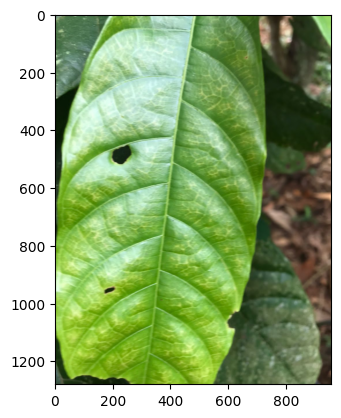

In [36]:
# Plot the rnd_no_detect_image
image_path = TEST_IMAGES_DIR / rnd_no_detect_image
image = np.array(Image.open(str(image_path)))
plt.imshow(image);

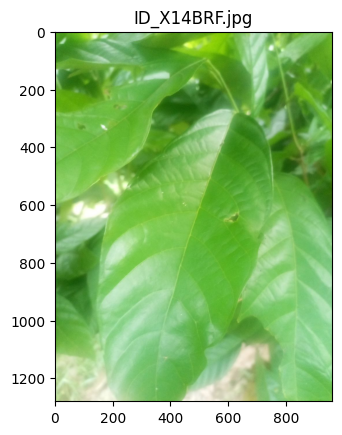

--------------------------------------



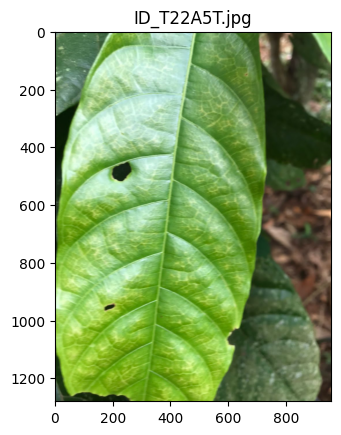

--------------------------------------



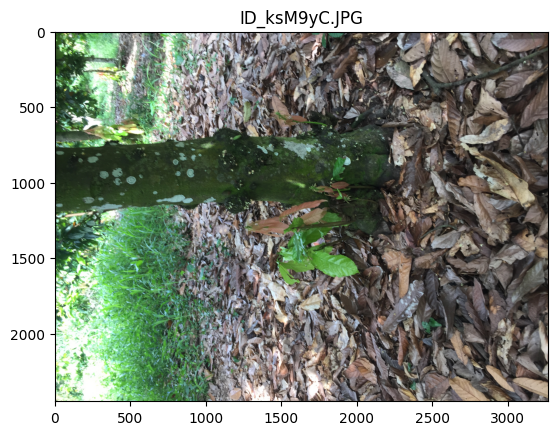

--------------------------------------



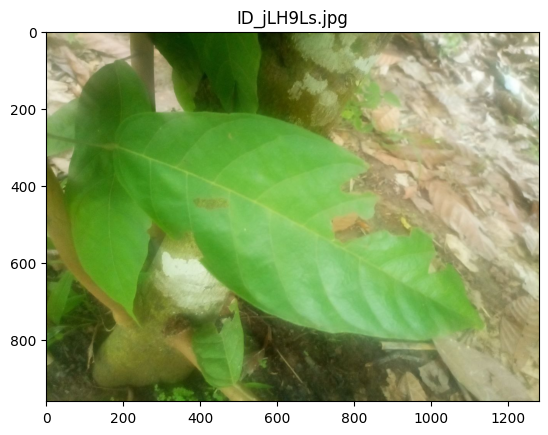

--------------------------------------



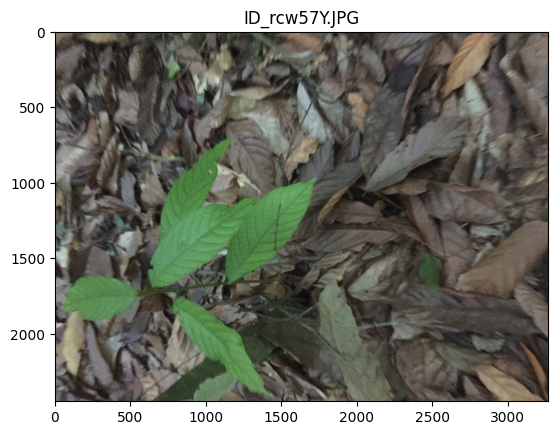

--------------------------------------



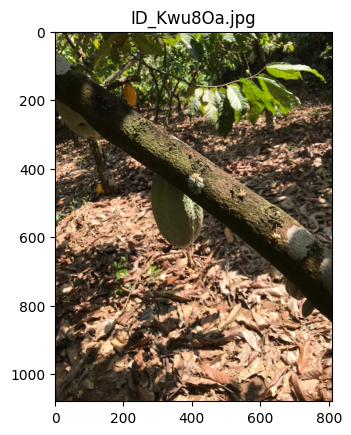

--------------------------------------



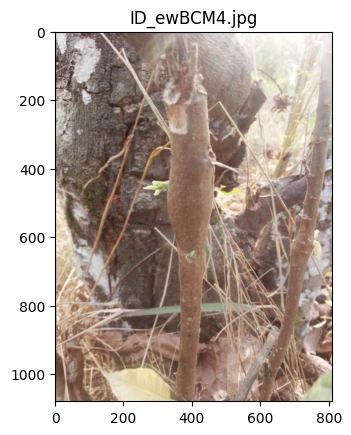

--------------------------------------



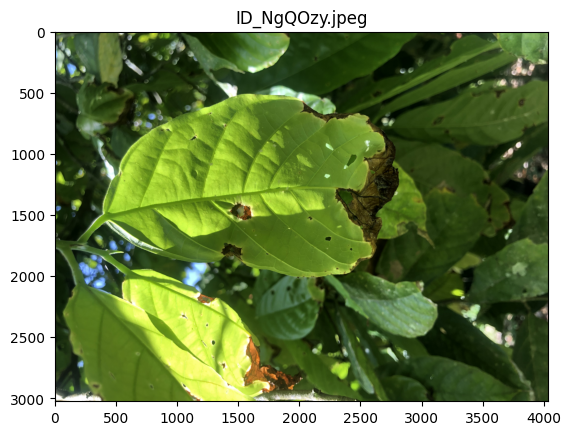

--------------------------------------



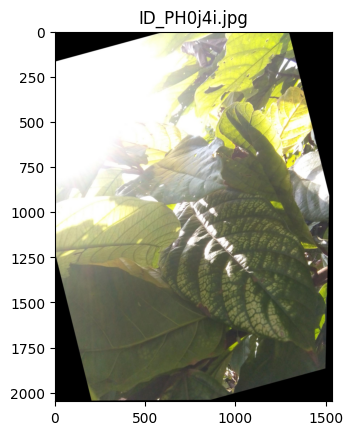

--------------------------------------



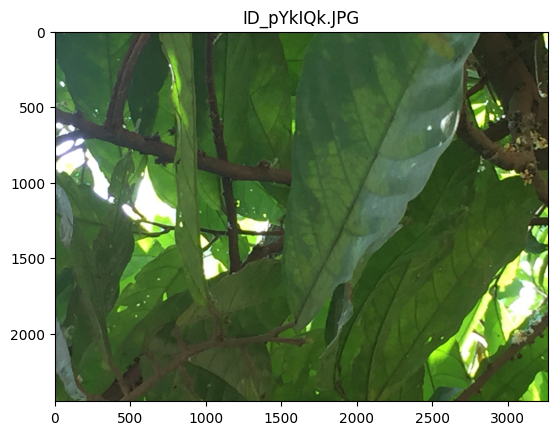

--------------------------------------



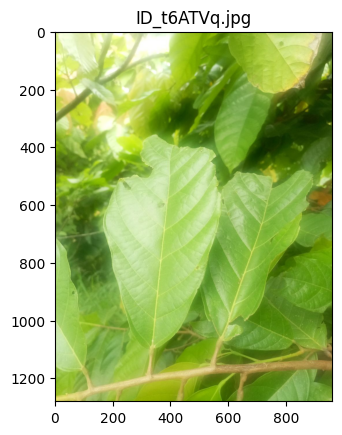

--------------------------------------



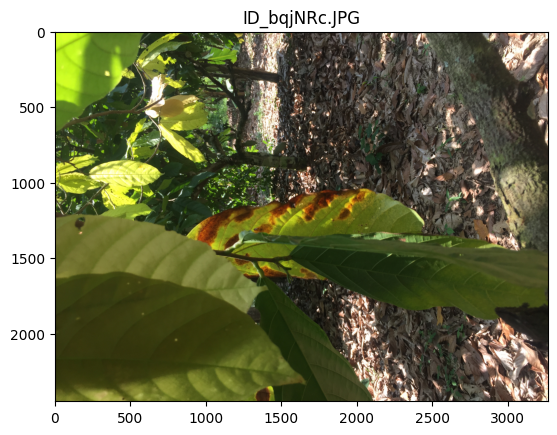

--------------------------------------



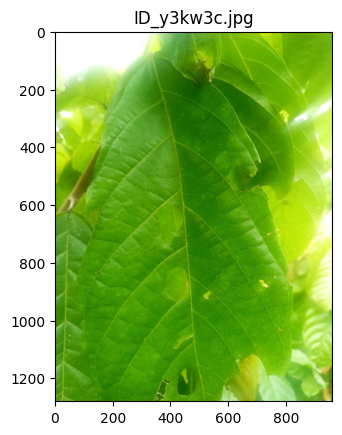

--------------------------------------



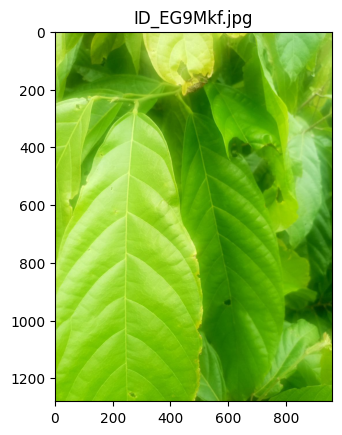

--------------------------------------



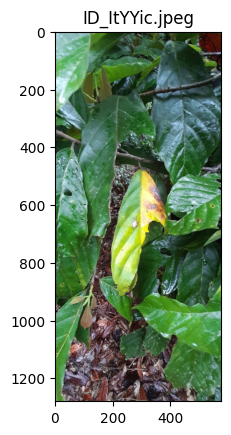

--------------------------------------



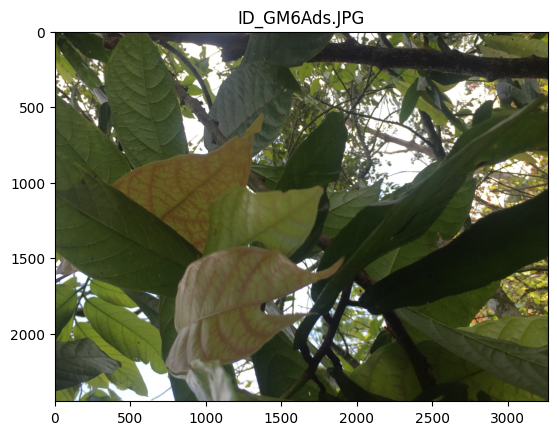

--------------------------------------



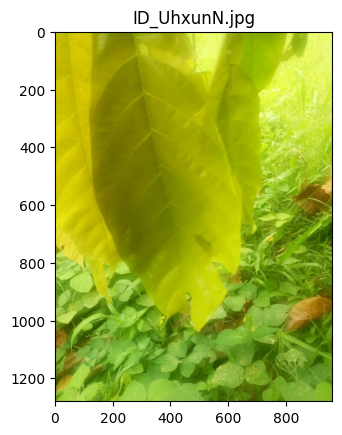

--------------------------------------



In [38]:
# Plot each of the image in no_detection dataframe
for image_name in no_detection['Image_ID'].unique():
    image_path = TEST_IMAGES_DIR / image_name
    plt.title(image_name)
    image = np.array(Image.open(str(image_path)))
    plt.imshow(image)
    plt.show()
    print('--------------------------------------\n')